In [1]:
import pandas as pd # Version 1.5.3
import seaborn as sns   # Version 0.13.2
import matplotlib.pyplot as plt # matplotlib Version 3.10.0
import starbars as sb   # Version 3.1.0 (pip install starbars==3.1.0)
import numpy as np  # numpy Version 1.26.4
import scipy.stats as stats # scipy Version 1.14.0

from matplotlib.transforms import ScaledTranslation

# Loading the data

## Loading Longform iBA Data

In [2]:
DF = pd.read_csv("peripheral_ibas_longform.csv")

In [3]:
#Check if data types are as expected
DF.dtypes

Unnamed: 0                    int64
BA                           object
Conc                        float64
Fasted/Fed                   object
Serum/Plasma                 object
Analysis Technique           object
Healthy/Unhealthy            object
Exact Analysis Technique     object
Starting Volume             float64
Average Age                 float64
Number of Patients          float64
Protein Precipitation        object
NAFLD/NASH/Cirrhosis         object
Liver/Non-Liver              object
IS                           object
dtype: object

## Loading Longform totalBA Data

In [4]:
total_DF = pd.read_csv("peripheral_total_longform.csv")

In [5]:
#Check if data types are as expected
total_DF.dtypes

Unnamed: 0                 int64
BA                        object
Conc                     float64
Fasted/Fed                object
Serum/Plasma              object
Analysis Technique        object
Healthy/Unhealthy         object
Liver/Non-liver           object
NAFLD/NASH/Cirrhosis      object
Protein Precipitation     object
Starting Volume          float64
dtype: object

## Loading peripheral data

In [6]:
peripheral_data = pd.read_csv("peripheral_data_nm.csv")

# Fig 2 : Individual and Total Bile Acids in Normal and Unhealthy Cohorts

In [8]:
healthy_unhealthy_DF = DF.loc[DF['Healthy/Unhealthy'].isin(["Normal", "Unhealthy"])]
healthy_unhealthy_total_DF = total_DF.loc[total_DF['Healthy/Unhealthy'].isin(["Normal", "Unhealthy"])]

In [9]:
peripheral_data["Total BAs"] = peripheral_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

In [10]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]
    elif type == "total":
        bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Conc"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

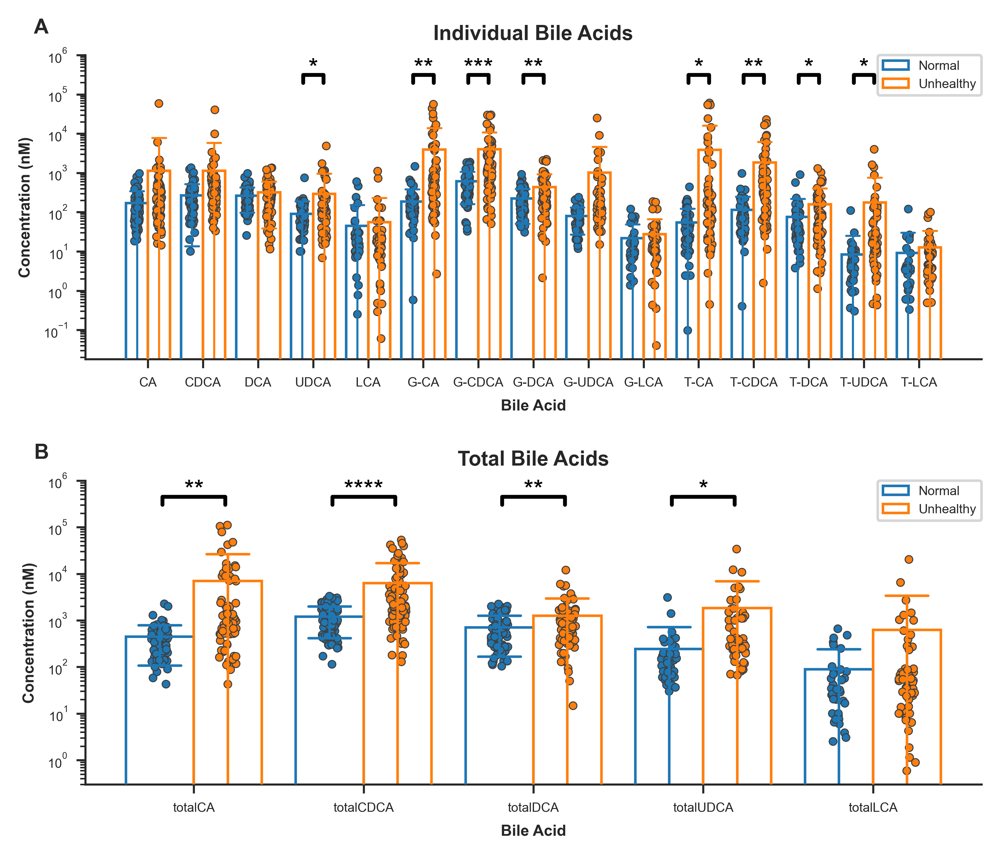

In [ ]:
fig, axs = plt.subplot_mosaic([['A', 'A', 'A'], ['B', 'B','B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

#Fig A

sns.barplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_DF, ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, hue_order=["Normal", "Unhealthy"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, hue_order=["Normal", "Unhealthy"], legend=False, zorder=1)


ax1.set_ylabel('Concentration (nM)', fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids", fontsize=8, weight='bold')
ax1.set_yscale('log')



#Fig B

sns.barplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_total_DF, ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["Normal", "Unhealthy"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Healthy/Unhealthy', data=healthy_unhealthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, hue_order=["Normal", "Unhealthy"], legend=False, zorder=1)

ax2.set_ylabel('Concentration (nM)', fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids", fontsize=8, weight='bold')
ax2.set_yscale('log')

for ax in [ax1,ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=5)
    ax.yaxis.set_tick_params(labelsize=5)
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)


plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

#Annotations
#Ax1
ax1_annotations = automatic_annotations(healthy_unhealthy_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None, 1e6)

#Ax2
ax2_annotations = automatic_annotations(healthy_unhealthy_total_DF, type="total")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(None, 1e6)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')

plt.savefig("F2.png", bbox_inches='tight')

plt.show()

# Fig 3: Stratifying cohorts for liver disease. total BA, Conj:Unconj, Secondary:Primary

In [11]:
metabolic_hcc_peripheral_data = peripheral_data.loc[peripheral_data["Metabolic/HCC/Cholestatsis"].isin(["Normal", "Metabolic", "HCC", "Cholestasis"])]

In [12]:
nafld_cirrhosis_peripheral_data = peripheral_data.loc[peripheral_data["NAFLD/NASH/Cirrhosis"].isin(["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"])]

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1796851524.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1796851524.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1796851524.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1796851524.py:53: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax4.set_xticklabels(ax_xticklabels)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1796

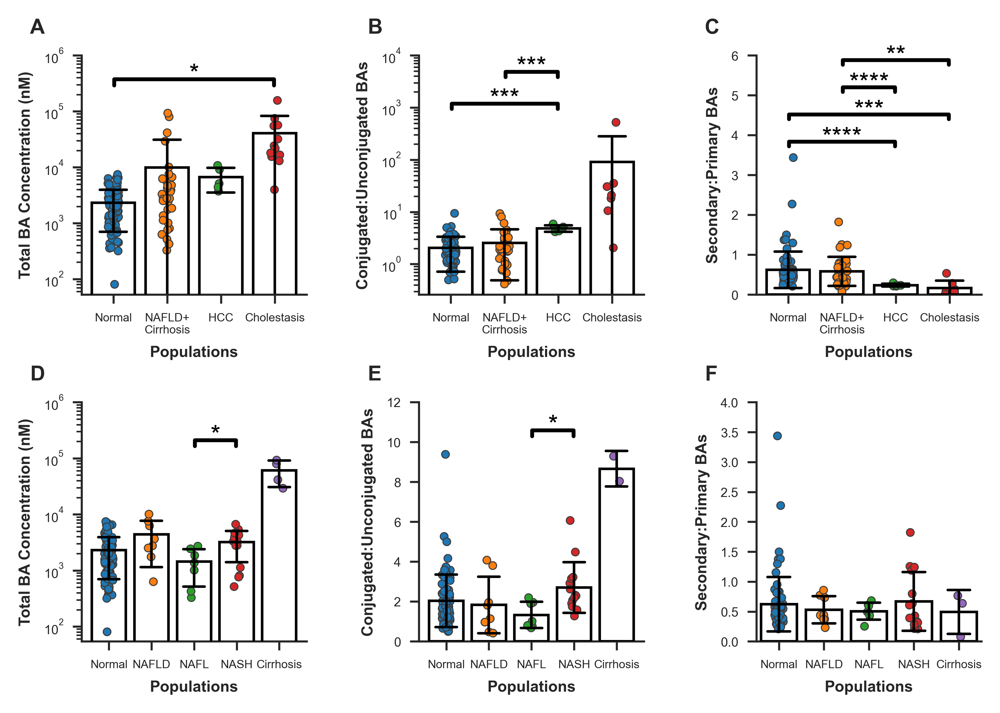

In [159]:
fig, axs = plt.subplot_mosaic([['A', 'B', 'C'], ['D', 'E','F']], figsize=(6.26, 4), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']
ax4 = axs['D']
ax5 = axs['E']
ax6 = axs['F']

#Fig A
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Total BAs", ax=ax1, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)

ax1.set_ylabel("Total BA Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Populations", fontsize=6, weight='bold')
ax1.set_yscale('log')
ax_xticklabels = ["Normal", "NAFLD+\nCirrhosis", "HCC", "Cholestasis"] 
ax1.set_xticklabels(ax_xticklabels)

#Fig B
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="Conjugated:Unconjugated", ax=ax2, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)



ax2.set_ylabel("Conjugated:Unconjugated BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Populations", fontsize=6, weight='bold')
ax2.set_yscale('log')

ax2.set_xticklabels(ax_xticklabels)

#Fig C
sns.barplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=metabolic_hcc_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=10)
sns.stripplot(x="Metabolic/HCC/Cholestatsis", y="2nd:1st", ax=ax3, data=metabolic_hcc_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="Metabolic/HCC/Cholestatsis", hue_order=["Normal", "Metabolic", "HCC", "Cholestasis"], zorder=1)


ax3.set_ylabel("Secondary:Primary BAs", fontsize=6, weight='bold')
ax3.set_xlabel("Populations", fontsize=6, weight='bold')

ax3.set_xticklabels(ax_xticklabels)


#Fig D
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="Total BAs", ax=ax4, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="Total BAs", ax=ax4, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)


ax4.set_ylabel("Total BA Concentration (nM)", fontsize=6, weight='bold')
ax4.set_xlabel("Populations", fontsize=6, weight='bold')
ax4.set_yscale('log')

ax_xticklabels = ["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"] 
ax4.set_xticklabels(ax_xticklabels)

#Fig E
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="Conjugated:Unconjugated", ax=ax5, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="Conjugated:Unconjugated", ax=ax5, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)



ax5.set_ylabel("Conjugated:Unconjugated BAs", fontsize=6, weight='bold')
ax5.set_xlabel("Populations", fontsize=6, weight='bold')

ax5.set_ylim(0, 10)
ax5.set_xticklabels(ax_xticklabels)

#Fig F
sns.barplot(x="NAFLD/NASH/Cirrhosis", y="2nd:1st", ax=ax6, data=nafld_cirrhosis_peripheral_data, capsize=.5, errorbar="sd", fill=False, color='black', err_kws= {'linewidth': 1} , linewidth = 1, order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=10)
sns.stripplot(x="NAFLD/NASH/Cirrhosis", y="2nd:1st", ax=ax6, data=nafld_cirrhosis_peripheral_data, alpha=1,linewidth=0.4, size = 3, hue="NAFLD/NASH/Cirrhosis", hue_order=["Normal", "NAFLD", "NAFL", "NASH", "Cirrhosis"], zorder=1)


ax6.set_ylabel("Secondary:Primary BAs", fontsize=6, weight='bold')
ax6.set_xlabel("Populations", fontsize=6, weight='bold')
ax6.set_ylim(0, 3.5)
ax6.set_xticklabels(ax_xticklabels)

ax1_annotations = [(('Normal'), ('Cholestasis'), 0.0399)]
sb.draw_annotation(ax1_annotations, ax=ax1)
ax1.set_ylim(None, 1e6)

ax2_annotations = [(('NAFLD+\nCirrhosis'), ('HCC'), 0.0003), (('Normal'), ('HCC'), 0.0007)]
sb.draw_annotation(ax2_annotations, ax=ax2)
ax2.set_ylim(None, 1e4)

ax3_annotations = [ (('NAFLD+\nCirrhosis'), ('HCC'), 0.00009), (('Normal'), ('HCC'), 0.00001),(('NAFLD+\nCirrhosis'), ('Cholestasis'), 0.0022), (('Normal'), ('Cholestasis'), 0.0006)]
sb.draw_annotation(ax3_annotations, ax=ax3)
ax3.set_ylim(0, 6)

ax4_annotations = [(('NAFL'), ('NASH'), 0.0473)]
sb.draw_annotation(ax4_annotations, ax=ax4)
ax4.set_ylim(None, 1e6)

ax5_annotations = [(('NAFL'), ('NASH'), 0.0192)]
sb.draw_annotation(ax5_annotations, ax=ax5)
ax5.set_ylim(0, 12)


ax6.set_ylim(0, 4)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=4.5)
    ax.yaxis.set_tick_params(labelsize=5)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.45)


plt.savefig("F3.png", bbox_inches='tight')

plt.show()

# Fig 4: Analytical Technique Used

In [13]:
#Dropping duplicates in paper subset to tally the use of Analytical technique since
#in some cases there are more than 1 BA concentration dataset from a given paper
no_duplicates = peripheral_data.drop_duplicates(subset=["Paper"])

In [14]:
technique_count = no_duplicates['Analysis Technique'].value_counts()
technique_count.sort_values()

Analysis Technique
Capillary Electrophoresis     1
HPLC                          2
GLC                           3
GC-MS                        10
LC-MS                        49
Name: count, dtype: int64

In [15]:
healthy_DF = DF.loc[DF['Healthy/Unhealthy'].isin(["Normal"])]
healthy_total_DF = total_DF.loc[total_DF['Healthy/Unhealthy'].isin(["Normal"])]

In [16]:
lcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"] == "LC-MS"]
lcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"] == "LC-MS"]

In [17]:
gcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"] == "GC-MS"]
gcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"] == "GC-MS"]

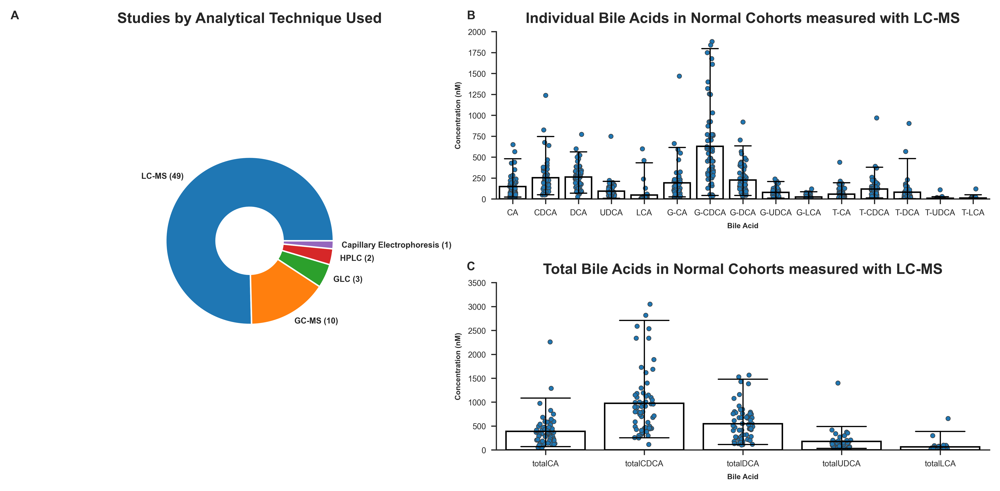

In [165]:
fig, axs = plt.subplot_mosaic([['A', 'B'], ['A', 'C']], figsize=(12, 5), dpi=600)


ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']

#Fig A - Pie Chart of Studies by Analytical Technique Used
ax1.pie(
    technique_count, labels=[f"{value} ({count})" for value, count in technique_count.items()], textprops={'fontsize': 5.5, 'fontweight': 'bold'}, radius=0.5, wedgeprops=dict(width=0.3))

ax1.set_title("Studies by Analytical Technique Used",fontsize=10, weight='bold', loc='center')

#Fig B - Individual Bile Acids in Normal Cohorts
sns.barplot(x="BA", y="Conc", data=lcms_healthy_DF, ax=ax2, errorbar="pi", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, color = 'black', zorder=10, )
sns.stripplot(x='BA', y='Conc', data=lcms_healthy_DF, dodge=False, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1)

ax2.set_ylim(0, 2000)
ax2.set_ylabel("Concentration (nM)", fontsize=5, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=5, weight='bold')
ax2.set_title("Individual Bile Acids in Normal Cohorts measured with LC-MS", fontsize=10, weight='bold')

#Fig C - Total Bile Acids in Normal Cohorts
sns.barplot(x="BA", y="Conc", data=lcms_healthy_total_DF, ax=ax3, errorbar="pi", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, color = 'black', zorder=10, )
sns.stripplot(x='BA', y='Conc', data=lcms_healthy_total_DF, dodge=False, alpha=1, ax=ax3, linewidth=0.4, size = 3, legend=False, zorder=1)

ax3.set_ylim(0, 3500)
ax3.set_ylabel("Concentration (nM)", fontsize=5, weight='bold')
ax3.set_xlabel("Bile Acid", fontsize=5, weight='bold')
ax3.set_title("Total Bile Acids in Normal Cohorts measured with LC-MS", fontsize=10, weight='bold')

for label, ax in axs.items():
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=5.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')

plt.subplots_adjust(wspace=0, top=0.9, hspace=0.5)

plt.savefig("F4.png", bbox_inches='tight')

plt.show()

# Fig 5: Deuterated Internal Standards

In [18]:
IS_DF = DF.loc[DF["IS"].isin(["D", "N"])]

In [19]:
normal_IS_DF = IS_DF[IS_DF["Healthy/Unhealthy"] == "Normal"]
unhealthy_IS_DF = IS_DF[IS_DF["Healthy/Unhealthy"] == "Unhealthy"]

In [168]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        d_values = ba_filtered[ba_filtered["IS"] == "D"]["Conc"].dropna().to_list()
        n_values = ba_filtered[ba_filtered["IS"] == "N"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(d_values, n_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("D", ba), ("N", ba), p_value))

    return annotations

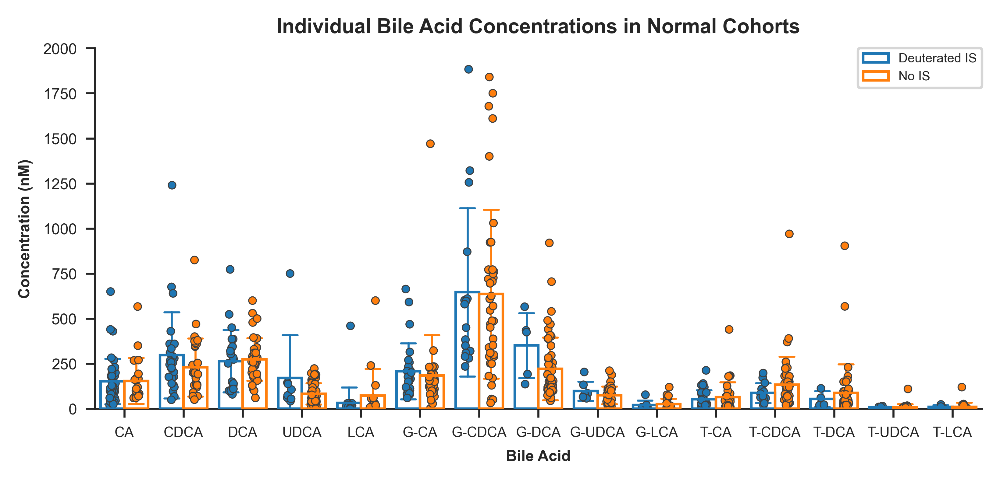

In [169]:
fig, axs = plt.subplot_mosaic([['A']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']

sns.set_style("ticks")

sns.barplot(data=normal_IS_DF, x="BA", y="Conc", ax=ax1, hue="IS", hue_order=["D", "N"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=normal_IS_DF, x="BA", y="Conc", ax=ax1, hue="IS", hue_order=["D", "N"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4)

ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')


#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(normal_IS_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(0,2000)


for label, ax in axs.items():
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

handles, labels_ = ax1.get_legend_handles_labels()
ax1.legend(handles, ["Deuterated IS", "No IS"], loc='upper right', borderaxespad=0., fontsize=5)

ax1.set_title("Individual Bile Acid Concentrations in Normal Cohorts", fontsize=8, weight='bold')

plt.savefig("F5.png", bbox_inches='tight')

plt.show()


# Supplementary Fig 5: Individual Bile Acids in Normal Cohorts by Analytical Technique

In [20]:
lcms_gcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"].isin(["LC-MS", "GC-MS"])]
lcms_gcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"].isin(["LC-MS", "GC-MS"])]

In [171]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        #Sophie: Select one bile acid type
        ba_filtered = DF[DF["BA"] == ba]
        #remove missing data
        lcms_values = ba_filtered[ba_filtered["Analysis Technique"] == "LC-MS"]["Conc"].dropna().to_list()
        gcms_values = ba_filtered[ba_filtered["Analysis Technique"] == "GC-MS"]["Conc"].dropna().to_list()
        if len(lcms_values) < 5 or len(gcms_values) < 5:
            p_value = np.nan
        else:
            # Perform Welch's t-test
            t_statistic, p_value = stats.ttest_ind(lcms_values, gcms_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        if not pd.isnull(p_value):
            annotations.append((("LC-MS", ba), ("GC-MS", ba), p_value))

    return annotations

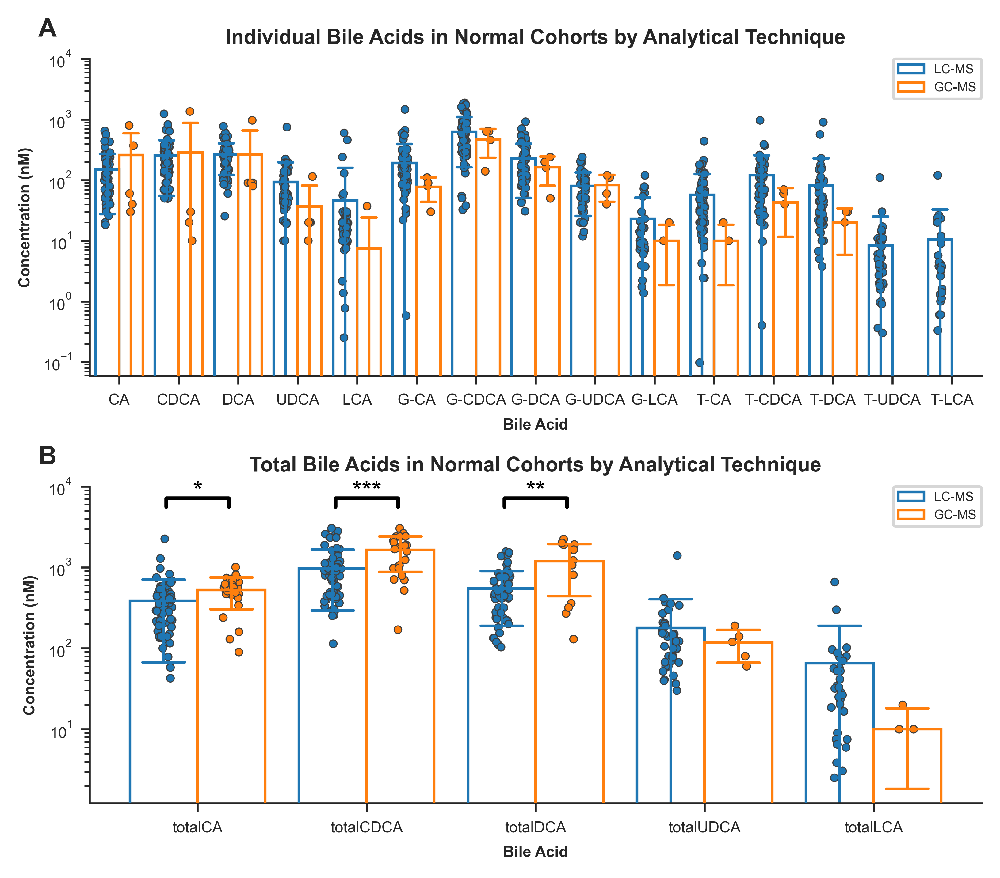

In [172]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']


#Fig A - iBAs - LC-MS vs GC-MS
sns.barplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_DF, ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["LC-MS", "GC-MS"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_DF, ax=ax1, dodge=True, alpha=1, linewidth=0.4, size = 3, hue_order=["LC-MS", "GC-MS"], legend=False, zorder=1)


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Normal Cohorts by Analytical Technique", fontsize=8, weight='bold')
ax1.set_yscale('log')
ax1.set_ylim(None, 1e4)

#Fig B - totalBAs - LC-MS vs GC-MS
sns.barplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_total_DF, ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, hue_order=["LC-MS", "GC-MS"], linewidth=1, zorder=10)
sns.stripplot(x='BA', y='Conc', hue='Analysis Technique', data=lcms_gcms_healthy_total_DF, ax=ax2, dodge=True, alpha=1, linewidth=0.4, size = 3, hue_order=["LC-MS", "GC-MS"], legend=False, zorder=1)


ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Normal Cohorts by Analytical Technique", fontsize=8, weight='bold')
ax2.set_yscale('log')
#ax3.set_ylim(0, 3500)


for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=6)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


ax2_annotations = automatic_annotations(lcms_gcms_healthy_total_DF, "total")
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e4)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.35)

plt.savefig("S5.png", bbox_inches='tight')

plt.show()

# Fig 6: Individual Bile Acids in Normal Cohorts from LC-MS Studies by Fed Status

In [21]:
lcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"].isin(["LC-MS"])]
lcms_healthy_total_DF = healthy_total_DF[healthy_total_DF["Analysis Technique"].isin(["LC-MS"])]

In [22]:
lcms_fasted_fed_healthy_DF = lcms_healthy_DF[lcms_healthy_DF["Fasted/Fed"].isin(["Fasted", "Fed"])]
lcms_fasted_fed_healthy_total_DF = lcms_healthy_total_DF[lcms_healthy_total_DF["Fasted/Fed"].isin(["Fasted", "Fed"])]

In [175]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        fasted_values = ba_filtered[ba_filtered["Fasted/Fed"] == "Fasted"]["Conc"].dropna().to_list()
        fed_values = ba_filtered[ba_filtered["Fasted/Fed"] == "Fed"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(fasted_values, fed_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        if not pd.isnull(p_value):
            annotations.append((("Fasted", ba), ("Fed", ba), p_value))

    return annotations

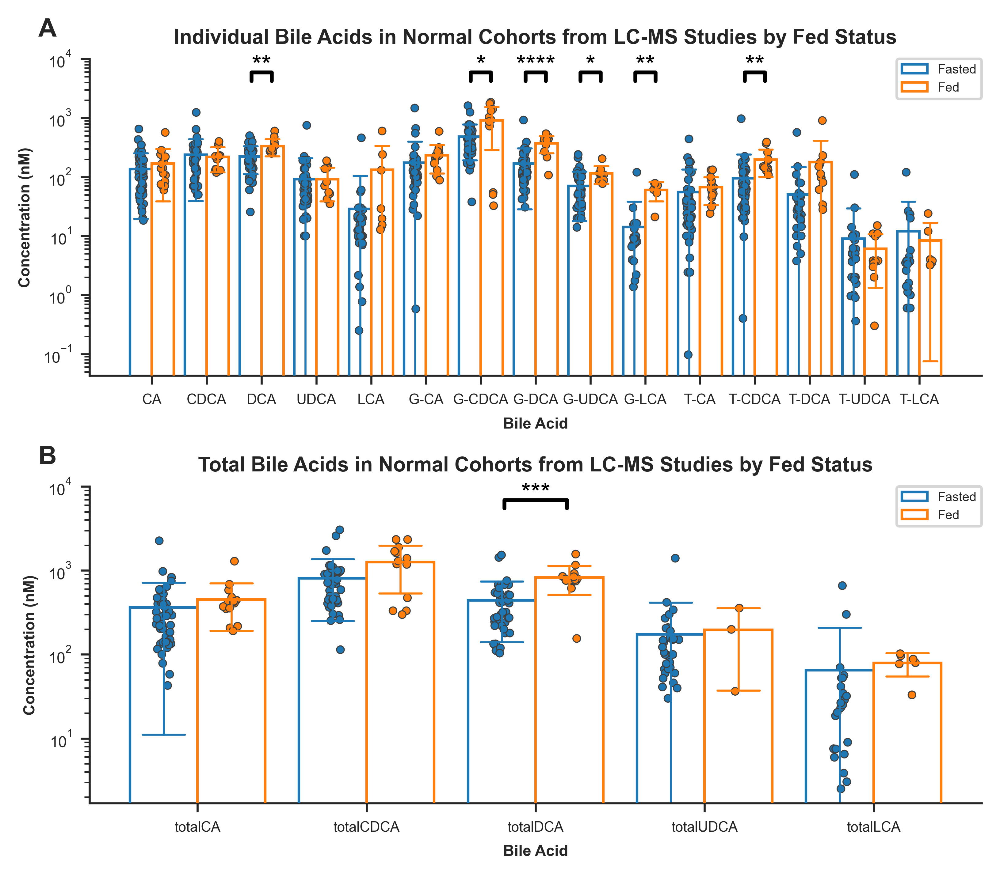

In [176]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - LC-MS iBAs by Fasted/Fed
sns.barplot(x="BA", y="Conc", data=lcms_fasted_fed_healthy_DF, ax=ax1, hue="Fasted/Fed", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Fasted", "Fed"], zorder=10)
#sns.pointplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_DF, ax=ax1, hue="Fasted/Fed", errorbar='sd', linestyle="none", capsize=0.3, err_kws= {'linewidth': 0.8}, dodge=0.4, marker="_", markersize=12, markeredgewidth=2, zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, hue="Fasted/Fed", hue_order=["Fasted", "Fed"], zorder=1)


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Normal Cohorts from LC-MS Studies by Fed Status", fontsize=8, weight='bold')
ax1.set_yscale('log')



#Fig B - LC-MS totalBAs by Fasted/Fed
sns.barplot(x="BA", y="Conc", data=lcms_fasted_fed_healthy_total_DF, ax=ax2, hue="Fasted/Fed", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Fasted", "Fed"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_fasted_fed_healthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, hue="Fasted/Fed", hue_order=["Fasted", "Fed"], zorder=1)


ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Normal Cohorts from LC-MS Studies by Fed Status", fontsize=8, weight='bold')
ax2.set_yscale('log')


for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)



ax1_annotations = automatic_annotations(lcms_fasted_fed_healthy_DF, "individual")
sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False, top_margin=0.0001 )
ax1.set_ylim(None, 1e4)


ax2_annotations = automatic_annotations(lcms_fasted_fed_healthy_total_DF, "total")
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e4)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.35)

plt.savefig("F6.png", bbox_inches='tight')

plt.show()


# Fig 7: Total Bile Acids in Fasted Normal Cohorts from LC-MS Studies by Analysed Material

In [23]:
lcms_fasted_healthy_DF = lcms_healthy_DF[lcms_healthy_DF["Fasted/Fed"].isin(["Fasted"])]
lcms_fasted_healthy_total_DF = lcms_healthy_total_DF[lcms_healthy_total_DF["Fasted/Fed"].isin(["Fasted"])]

In [24]:
lcms_serum_plasma_fasted_healthy_DF = lcms_fasted_healthy_DF[lcms_fasted_healthy_DF["Serum/Plasma"].isin(["Serum", "Plasma"])]
lcms_serum_plasma_fasted_healthy_total_DF = lcms_fasted_healthy_total_DF[lcms_fasted_healthy_total_DF["Serum/Plasma"].isin(["Serum", "Plasma"])]

In [52]:
def automatic_annotations(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
        plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(serum_values, plasma_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Serum", ba), ("Plasma", ba), p_value))

    return annotations

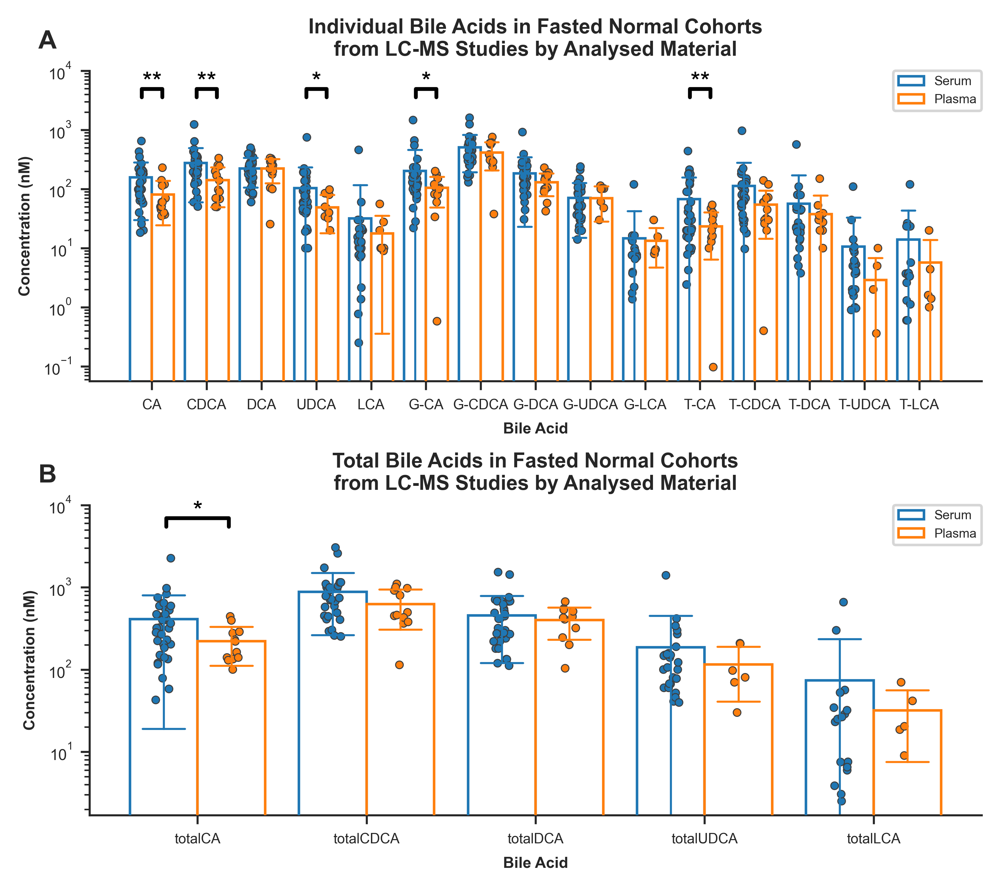

In [180]:
fig, axs = plt.subplot_mosaic([['A'],['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - LC-MS Fasted iBAs by Serum/Plasma
sns.barplot(x="BA", y="Conc", data=lcms_serum_plasma_fasted_healthy_DF, ax=ax1, hue="Serum/Plasma", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Serum", "Plasma"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_serum_plasma_fasted_healthy_DF, dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, hue="Serum/Plasma", hue_order=["Serum", "Plasma"], zorder=1)

ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Individual Bile Acids in Fasted Normal Cohorts\nfrom LC-MS Studies by Analysed Material", fontsize=8, weight='bold')
ax1.set_yscale('log')

#Fig B - LC-MS Fasted totalBAs by Serum/Plasma
sns.barplot(x="BA", y="Conc", data=lcms_serum_plasma_fasted_healthy_total_DF, ax=ax2, hue="Serum/Plasma", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, hue_order=["Serum", "Plasma"], zorder=10)
sns.stripplot(x='BA', y='Conc', data=lcms_serum_plasma_fasted_healthy_total_DF, dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, hue="Serum/Plasma", hue_order=["Serum", "Plasma"], zorder=1)

ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Total Bile Acids in Fasted Normal Cohorts\nfrom LC-MS Studies by Analysed Material", fontsize=8, weight='bold')
ax2.set_yscale('log')

for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
ax1.xaxis.set_tick_params(labelsize=5.5)

ax1_annotations = automatic_annotations(lcms_serum_plasma_fasted_healthy_DF, "individual")
sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False, top_margin=0.0001)
ax1.set_ylim(None, 1e4)

ax2_annotations = automatic_annotations(lcms_serum_plasma_fasted_healthy_total_DF, "total")
sb.draw_annotation(ax2_annotations, ax=ax2, ns_show=False, top_margin=0.0001)
ax2.set_ylim(None, 1e4)

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.4)

plt.savefig("F7.png", bbox_inches='tight')

plt.show()

# Supplmentary Table 1: Brown-Forsythe Serum vs Plasma

In [181]:
#Statistical test for altered variance in iBAs- Brown-Forsythe

bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

p_values = {}
for ba in bas_list:
    ba_filtered = lcms_serum_plasma_fasted_healthy_DF[lcms_serum_plasma_fasted_healthy_DF["BA"] == ba]
    serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
    plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(serum_values, plasma_values, center='median')

    p_values.update({ba: [p_value, np.var(serum_values), np.var(plasma_values)]})


In [182]:
p_values

{'CA': [np.float64(0.07668786591157364),
  np.float64(15652.295718967769),
  np.float64(2950.6946792899403)],
 'CDCA': [np.float64(0.26489735588470176),
  np.float64(46090.335991135056),
  np.float64(7822.22296331361)],
 'DCA': [np.float64(0.43203997015734474),
  np.float64(12986.798485361445),
  np.float64(8955.395756213018)],
 'UDCA': [np.float64(0.2981525848907993),
  np.float64(16115.068205295007),
  np.float64(849.208644)],
 'LCA': [np.float64(0.646346673802658),
  np.float64(6935.34563623903),
  np.float64(267.35984375)],
 'G-CA': [np.float64(0.31310079113650974),
  np.float64(64943.11169652964),
  np.float64(2913.497240310643)],
 'G-CDCA': [np.float64(0.4694993367683189),
  np.float64(97948.41273118301),
  np.float64(40124.84)],
 'G-DCA': [np.float64(0.2748439514987026),
  np.float64(25020.969360992418),
  np.float64(2651.9691786982244)],
 'G-UDCA': [np.float64(0.7863716179769509),
  np.float64(3020.4939886517764),
  np.float64(1501.4158984375)],
 'G-LCA': [np.float64(0.64923744

In [183]:
#Statistical test for altered variance in totalBAs- Brown-Forsythe

bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]

p_values = {}
for ba in bas_list:
    ba_filtered = lcms_serum_plasma_fasted_healthy_total_DF[lcms_serum_plasma_fasted_healthy_total_DF["BA"] == ba]
    serum_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Conc"].dropna().to_list()
    plasma_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Conc"].dropna().to_list()
    
    #stat, p_value = stats.levene(serum_values, plasma_values)
    stat, p_value = stats.levene(serum_values, plasma_values, center='median')

    p_values.update({ba: [p_value, np.var(serum_values), np.var(plasma_values)]})

In [184]:
p_values

{'totalCA': [np.float64(0.1508842641265256),
  np.float64(149840.17917910204),
  np.float64(11210.72388888889)],
 'totalCDCA': [np.float64(0.40555727734129954),
  np.float64(366615.32713985426),
  np.float64(92448.31222222222)],
 'totalDCA': [np.float64(0.17729087924458264),
  np.float64(108504.55146865235),
  np.float64(25982.837190082646)],
 'totalUDCA': [np.float64(0.5551286342165156),
  np.float64(67970.13671775149),
  np.float64(4645.776989533334)],
 'totalLCA': [np.float64(0.5083668550297848),
  np.float64(24523.38863333334),
  np.float64(475.8495999999999)]}

# Supplementary Fig 1: G-CDCA and T-UDCA concentration vs Starting Volume

In [25]:
plasma_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Plasma")] 

In [26]:
plasma_fasted_lcms_nm_data.loc[:, "Total BAs"] = plasma_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

In [27]:
gcdca_plasma_fasted_lcms_nm_data = plasma_fasted_lcms_nm_data[["G-CDCA", "Starting Volume", "Protein Precipitation"]].dropna()

In [28]:
gcdca_plasma_fasted_lcms_nm_data

,G-CDCA,Starting Volume,Protein Precipitation
40,235.0,50.0,Methanol
56,383.4,20.0,Methanol
69,760.0,100.0,Acetonitrile
104,570.0,100.0,Acetonitrile
105,310.0,100.0,Acetonitrile
111,602.0,50.0,Methanol
132,611.0,50.0,Methanol
133,598.0,50.0,Methanol
136,280.0,50.0,Acetonitrile
137,310.0,50.0,Acetonitrile


In [30]:
tudca_plasma_fasted_lcms_nm_data = plasma_fasted_lcms_nm_data[["T-UDCA", "Starting Volume", "Protein Precipitation"]].dropna()

In [31]:
tudca_plasma_fasted_lcms_nm_data

,T-UDCA,Starting Volume,Protein Precipitation
56,2.0000,20.0,Methanol
80,0.3608,50.0,Sodium Hydroxide
132,10.0000,50.0,Methanol
133,5.0000,50.0,Methanol
136,0.0000,50.0,Acetonitrile
137,0.0000,50.0,Acetonitrile


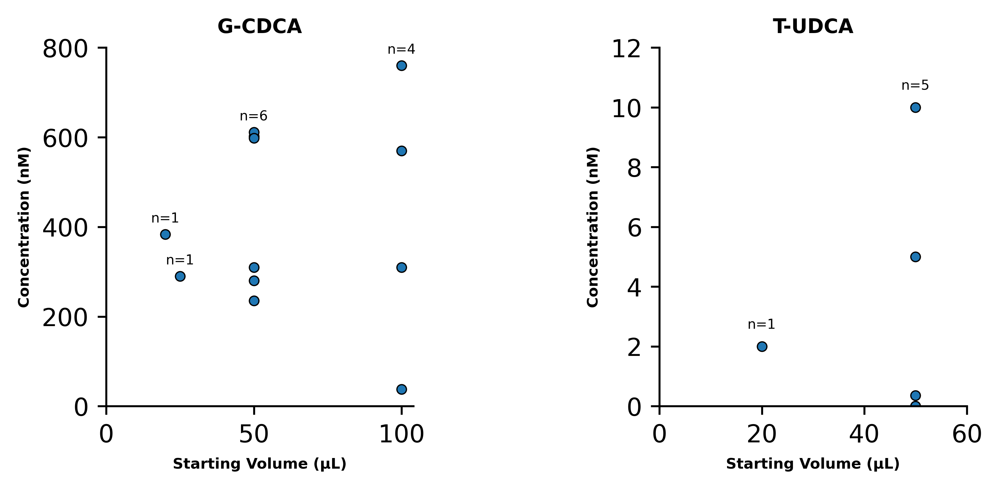

In [13]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']


#Fig C
sns.scatterplot(data=gcdca_plasma_fasted_lcms_nm_data, x="Starting Volume", y="G-CDCA", ax=ax1, s=15, edgecolor='black', linewidth=0.5)
ax1.set_ylim(0, 800)
ax1.set_xlim(0, None)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Starting Volume (µL)", fontsize=6, weight='bold')
ax1.set_title("G-CDCA", fontsize=8, weight='bold')

# #Fig D
sns.scatterplot(data=tudca_plasma_fasted_lcms_nm_data, x="Starting Volume", y="T-UDCA", ax=ax2, s=15, edgecolor='black', linewidth=0.5)
ax2.set_ylim(0, 12)
ax2.set_xlim(0, 60)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Starting Volume (µL)", fontsize=6, weight='bold')
ax2.set_title("T-UDCA", fontsize=8, weight='bold')

for label, ax in axs.items():
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.8, top=0.92, hspace=0.5)


# Add number of points for each x value on top of the scatter plot for G-CDCA
for x_val, group in gcdca_plasma_fasted_lcms_nm_data.groupby("Starting Volume"):
    n = group["G-CDCA"].count()
    y_max = group["G-CDCA"].max()
    ax1.text(x_val, y_max + 20, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

# Add number of points for each x value on top of the scatter plot for G-CDCA
for x_val, group in tudca_plasma_fasted_lcms_nm_data.groupby("Starting Volume"):
    n = group["T-UDCA"].count()
    y_max = group["T-UDCA"].max()
    ax2.text(x_val, y_max + 0.5, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

plt.savefig("S1.png", bbox_inches='tight')

plt.show()

# Fig 8: Starting Volume of Plasma and Serum

In [32]:
plasma_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Plasma")] 
serum_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Serum")] 

In [33]:
plasma_fasted_lcms_nm_data.loc[:, "Total BAs"] = plasma_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)
serum_fasted_lcms_nm_data.loc[:, "Total BAs"] = serum_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

In [34]:
gcdca_plasma_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="G-CDCA")]
tudca_plasma_fasted_lcms_normal_DF = healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["BA"]=="T-UDCA")]

In [35]:
gcdca_plasma_fasted_lcms_normal_DF = gcdca_plasma_fasted_lcms_normal_DF.reset_index().head()
gcdca_plasma_fasted_lcms_normal_DF = gcdca_plasma_fasted_lcms_normal_DF.drop(["index", "Unnamed: 0"], axis=1)

In [36]:
tudca_plasma_fasted_lcms_normal_DF = tudca_plasma_fasted_lcms_normal_DF.reset_index().head()
tudca_plasma_fasted_lcms_normal_DF = tudca_plasma_fasted_lcms_normal_DF.drop(["index", "Unnamed: 0"], axis=1)

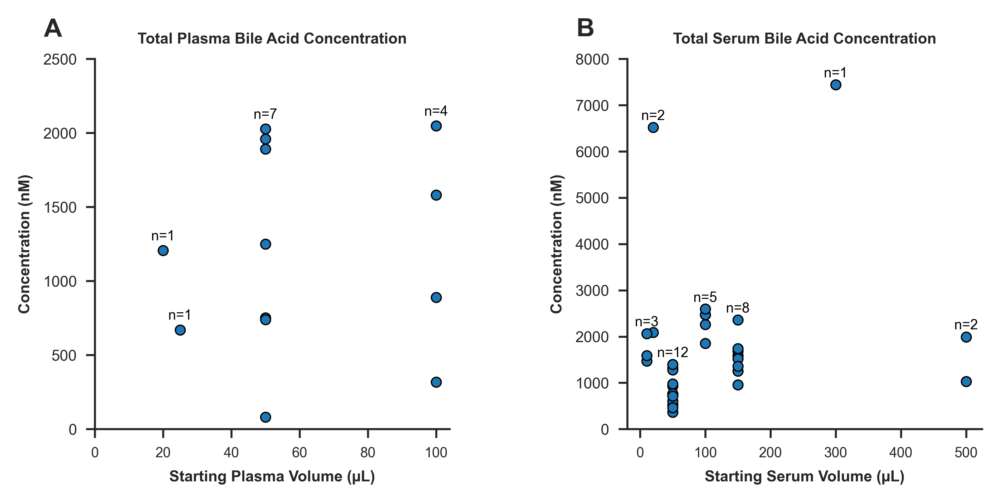

In [196]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A
sns.scatterplot(data=plasma_fasted_lcms_nm_data, x="Starting Volume", y="Total BAs", ax=ax1, s=15, edgecolor='black', linewidth=0.5)

ax1.set_ylim(0, 2500)
ax1.set_xlim(0,None)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Starting Plasma Volume (µL)", fontsize=6, weight='bold')
ax1.set_title("Total Plasma Bile Acid Concentration", fontsize=6, weight='bold')

#Add the number of cohorts on the graph
for x_val, group in plasma_fasted_lcms_nm_data.groupby("Starting Volume"):
    n = group["Total BAs"].count()
    y_max = group["Total BAs"].max()
    ax1.text(x_val, y_max + 50, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

#Fig B
sns.scatterplot(data=serum_fasted_lcms_nm_data, x="Starting Volume", y="Total BAs", ax=ax2, s=15, edgecolor='black', linewidth=0.5)

ax2.set_ylim(0, 8000)
ax2.set_xlim(-20,None)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Starting Serum Volume (µL)", fontsize=6, weight='bold')
ax2.set_title("Total Serum Bile Acid Concentration", fontsize=6, weight='bold')


#Add the number of cohorts on the graph
for x_val, group in serum_fasted_lcms_nm_data.groupby("Starting Volume"):
    n = group["Total BAs"].count()
    y_max = group["Total BAs"].max()
    ax2.text(x_val, y_max + 100, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

plt.subplots_adjust(wspace=0.5, top=0.92, hspace=0.4)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
ax1.xaxis.set_tick_params(labelsize=5.5)


plt.savefig("F8.png", bbox_inches='tight')
plt.show()



# Fig 9: Protein Precipitation Solvent

In [37]:
lcms_healthy_DF = healthy_DF[healthy_DF["Analysis Technique"] == "LC-MS"]
fasted_lcms_healthy_DF = lcms_healthy_DF[lcms_healthy_DF["Fasted/Fed"] == "Fasted"]
fasted_lcms_healthy_DF = fasted_lcms_healthy_DF.reset_index().head()
fasted_lcms_healthy_DF = fasted_lcms_healthy_DF.drop(["index", "Unnamed: 0"], axis=1)

In [38]:
lcms_healthy_DF = lcms_healthy_DF.drop(columns= ["Unnamed: 0"])

In [39]:
fasted_lcms_healthy_DF = lcms_healthy_DF[lcms_healthy_DF["Fasted/Fed"] == "Fasted"]

In [40]:
serum_fasted_lcms_healthy_DF = fasted_lcms_healthy_DF[fasted_lcms_healthy_DF["Serum/Plasma"] == "Serum"]
plasma_fasted_lcms_healthy_DF = fasted_lcms_healthy_DF[fasted_lcms_healthy_DF["Serum/Plasma"] == "Plasma"]

In [41]:
plasma_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Plasma")] 
serum_fasted_lcms_nm_data = peripheral_data.loc[ (peripheral_data["Healthy/Unhealthy"] == "Normal") & (peripheral_data["Analysis Technique"] == "LC-MS") & (peripheral_data["Fasted/Fed"] == "Fasted") & (peripheral_data["Serum/Plasma"] == "Serum")] 

In [42]:
plasma_fasted_lcms_nm_data.loc[:, "Total BAs"] = plasma_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)
serum_fasted_lcms_nm_data.loc[:, "Total BAs"] = serum_fasted_lcms_nm_data[["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]].sum(axis=1, min_count=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1544418125.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(["Methanol", "Acetonitrile", "Sodium\nHydroxide", "Trichloroacetic\nAcid"])
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1544418125.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(["Methanol", "Acetonitrile", "Ethanol", "Ethanol:\nH2O",  "Methanol:\nAcetonitrile", "Formic\nAcid"], rotation=30, ha='right', fontsize=5.5)


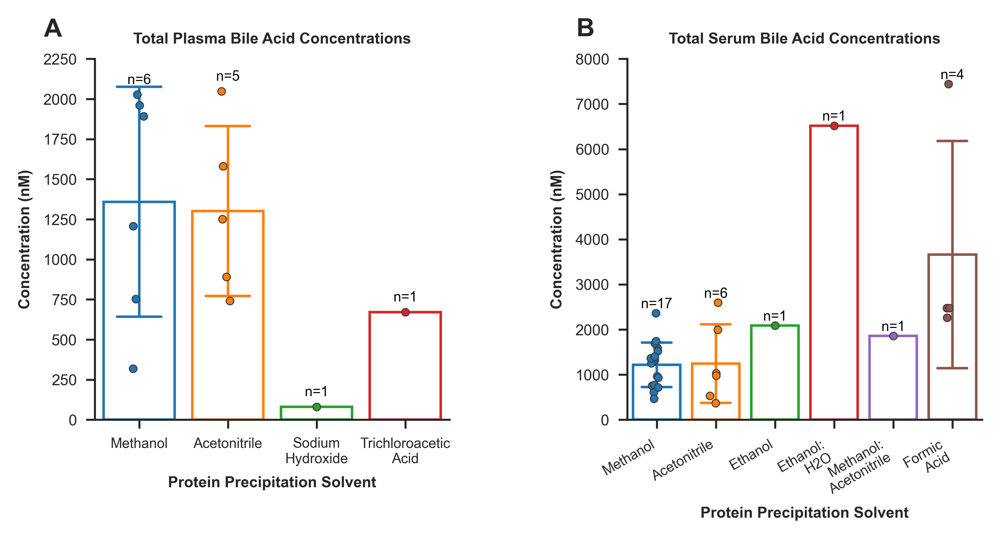

In [203]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - Plasma Bile Acids
sns.barplot(data=plasma_fasted_lcms_nm_data, x="Protein Precipitation", y="Total BAs", ax=ax1, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order= ["Methanol", "Acetonitrile", "Sodium Hydroxide", "Trichloroacetic Acid"], hue_order= ["Methanol", "Acetonitrile", "Sodium Hydroxide", "Trichloroacetic Acid"])
sns.stripplot(data=plasma_fasted_lcms_nm_data, x='Protein Precipitation', y='Total BAs', hue='Protein Precipitation', ax=ax1, dodge=False, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order = ["Methanol", "Acetonitrile", "Sodium Hydroxide", "Trichloroacetic Acid"])

ax1.set_ylim(0, 2250)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax1.set_title("Total Plasma Bile Acid Concentrations", fontsize=6, weight='bold')
ax1.set_xticklabels(["Methanol", "Acetonitrile", "Sodium\nHydroxide", "Trichloroacetic\nAcid"])

for i, category in enumerate(["Methanol", "Acetonitrile", "Sodium Hydroxide", "Trichloroacetic Acid"]):
        n = plasma_fasted_lcms_nm_data[plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["Total BAs"].count()
        ax1.text(i, 
                plasma_fasted_lcms_nm_data[plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["Total BAs"].max() + 50, 
                f"n={n}", 
                ha='center', va='bottom', fontsize=5.5, color='black')
        


#Fig B - Serum Bile Acids
sns.barplot(data=serum_fasted_lcms_nm_data, x="Protein Precipitation", y="Total BAs", ax=ax2, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order= ["Methanol", "Acetonitrile", "Ethanol", "Ethanol:H2O", "Methanol:Acetonitrile", "Formic Acid"], hue_order= ["Methanol", "Acetonitrile", "Ethanol", "Ethanol:H2O", "Methanol:Acetonitrile", "Formic Acid"])
sns.stripplot(data=serum_fasted_lcms_nm_data, x='Protein Precipitation', y='Total BAs', hue='Protein Precipitation', ax=ax2, dodge=False, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order=["Methanol", "Acetonitrile", "Ethanol", "Ethanol:H2O", "Methanol:Acetonitrile", "Formic Acid"])


        
ax2.set_ylim(0, 8000)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax2.set_title("Total Serum Bile Acid Concentrations", fontsize=6, weight='bold')
ax2.set_xticklabels(["Methanol", "Acetonitrile", "Ethanol", "Ethanol:\nH2O",  "Methanol:\nAcetonitrile", "Formic\nAcid"], rotation=30, ha='right', fontsize=5.5)

for i, category in enumerate(["Methanol", "Acetonitrile", "Ethanol", "Ethanol:H2O", "Methanol:Acetonitrile", "Formic Acid"]):
        n = serum_fasted_lcms_nm_data[serum_fasted_lcms_nm_data["Protein Precipitation"] == category]["Total BAs"].count()
        ax2.text(i, 
                serum_fasted_lcms_nm_data[serum_fasted_lcms_nm_data["Protein Precipitation"] == category]["Total BAs"].max() + 50, 
                f"n={n}", 
                ha='center', va='bottom', fontsize=5.5, color='black')

for label, ax in axs.items():
    ax.text(
        0.0, 1, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.2)
plt.savefig("F9.png", bbox_inches='tight')
plt.show()


# Fig 10: Filtered vs All data

In [43]:
healthy_DF["All/Filtered"] = "All"
healthy_total_DF["All/Filtered"] = "All"
healthy_DF["All"] = "All"
healthy_total_DF["All"] = "All"

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_13096\246599000.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_DF["All/Filtered"] = "All"
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_13096\246599000.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  healthy_total_DF["All/Filtered"] = "All"
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_13096\246599000.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

In [44]:
healthy_DF.loc[(healthy_DF["Analysis Technique"]=="LC-MS") & (healthy_DF["Fasted/Fed"]=="Fasted") & (healthy_DF["Serum/Plasma"]=="Plasma") & (healthy_DF["Starting Volume"] == 50) & (healthy_DF["Protein Precipitation"] == "Methanol"), "All/Filtered"] = "Filtered" 

In [45]:
healthy_total_DF.loc[(healthy_total_DF["Analysis Technique"]=="LC-MS") & (healthy_total_DF["Fasted/Fed"]=="Fasted") & (healthy_total_DF["Serum/Plasma"]=="Plasma") & (healthy_total_DF["Starting Volume"] == 50) & (healthy_total_DF["Protein Precipitation"] == "Methanol"), "All/Filtered"] = "Filtered" 

In [46]:
filtered_healthy_DF = healthy_DF[healthy_DF["All/Filtered"] == "Filtered"]
filtered_healthy_total_DF = healthy_total_DF[healthy_total_DF["All/Filtered"] == "Filtered"]

In [72]:
bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

list_of_dfs = []

for ba in bas_list:
    all_values = healthy_DF[healthy_DF["BA"] == ba].copy()
    all_values["PlotGroup"] = "All"

    filtered_values = filtered_healthy_DF[filtered_healthy_DF["BA"] == ba].copy()
    filtered_values["PlotGroup"] = "Filtered"

    combined_values = pd.concat([all_values, filtered_values], ignore_index=True)

    list_of_dfs.append(combined_values)

In [74]:
# After the loop, concatenate all collected DataFrames into one final DataFrame
plot_df_A_combined = pd.concat(list_of_dfs, ignore_index=True)

In [75]:
plot_df_A_combined

,Unnamed: 0,BA,Conc,Fasted/Fed,Serum/Plasma,Analysis Technique,Healthy/Unhealthy,Exact Analysis Technique,Starting Volume,Average Age,Number of Patients,Protein Precipitation,NAFLD/NASH/Cirrhosis,Liver/Non-Liver,IS,All/Filtered,All,PlotGroup
0,1,CA,142.0,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy,D,All,All,All
1,2,CA,184.0,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy,D,All,All,All
2,4,CA,107.0,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy,D,All,All,All
3,7,CA,115.0,Fed,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy,D,All,All,All
4,9,CA,199.0,Fasted,Serum,LC-MS,Normal,UPLC-TQMS,50.0,NaN,15.0,Methanol,Normal,Healthy,D,All,All,All
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,3223,T-LCA,NaN,Fasted,Serum,GLC,Normal,Capillary Gas Chromatography,2000.0,NaN,10.0,NaN,Normal,Healthy,NaN,All,All,All
1571,3050,T-LCA,1.0,Fasted,Plasma,LC-MS,Normal,LC-MS/MS,50.0,40.5,26.0,Methanol,Normal,Healthy,N,Filtered,All,Filtered
1572,3121,T-LCA,NaN,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,29.0,7.0,Methanol,NaN,Non-Liver,N,Filtered,All,Filtered
1573,3142,T-LCA,1.6,Fasted,Plasma,LC-MS,Normal,HPLC-MS/MS,50.0,38.5,85.0,Methanol,Normal,Healthy,N,Filtered,All,Filtered


In [ ]:
def automatic_annotations(DF, ):
    
    bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        all_values = healthy_DF[healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
        filtered_values = filtered_healthy_DF[filtered_healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
    
        stat, p_value = stats.levene(all_values, filtered_values, center='median')


        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("All", ba), ("Filtered", ba), p_value))

    return annotations


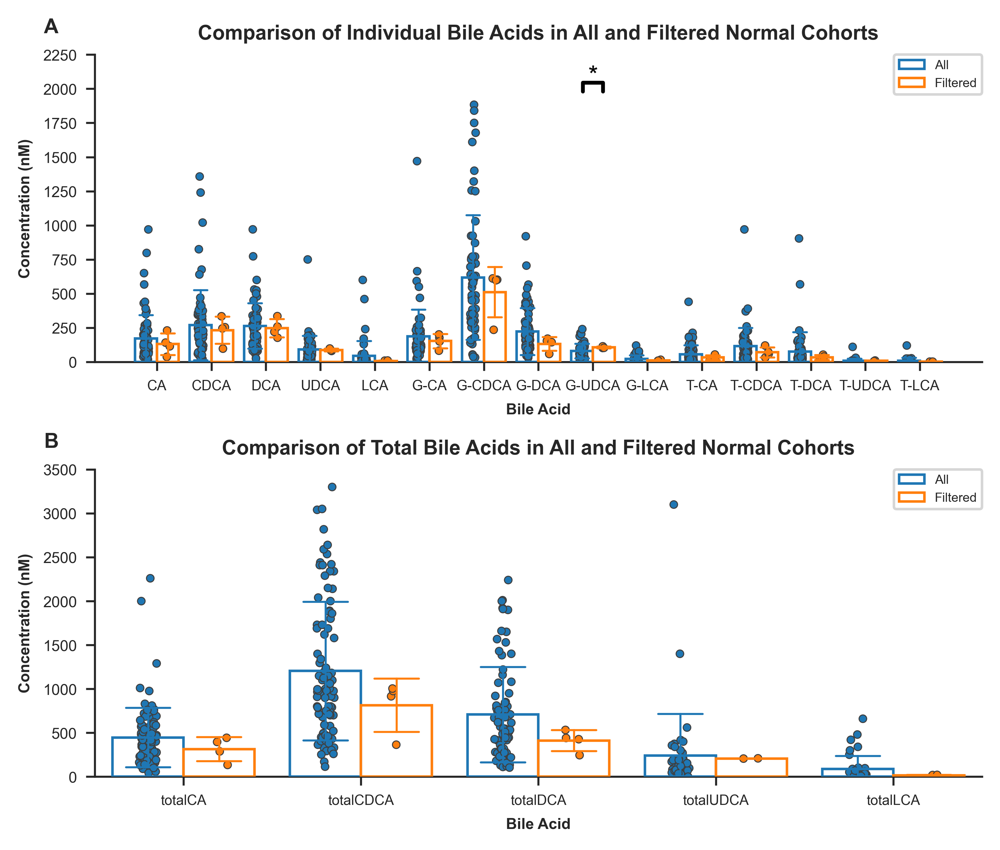

In [89]:
fig, axs = plt.subplot_mosaic([['A', 'A', 'A'], ['B', 'B','B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

#Fig A
sns.barplot(x="BA", y="Conc", data=plot_df_A_combined, hue="PlotGroup", ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True)
#sns.barplot(x="BA", y="Conc", data=filtered_healthy_DF, hue="All/Filtered", ax=ax1, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True, legend=False)
sns.stripplot(x='BA', y='Conc', data=plot_df_A_combined, hue="PlotGroup", dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])
#sns.stripplot(x='BA', y='Conc', data=filtered_healthy_DF, hue="All/Filtered", dodge=True, alpha=1, ax=ax1, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])

# 
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Comparison of Individual Bile Acids in All and Filtered Normal Cohorts", fontsize=8, weight='bold')


#Fig B
sns.barplot(x="BA", y="Conc", data=healthy_total_DF, hue="All", ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True)
sns.barplot(x="BA", y="Conc", data=filtered_healthy_total_DF, hue="All/Filtered", ax=ax2, errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, hue_order=["All", "Filtered"], dodge=True, legend=False)
sns.stripplot(x='BA', y='Conc', data=healthy_total_DF, hue="All", dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])
sns.stripplot(x='BA', y='Conc', data=filtered_healthy_total_DF, hue="All/Filtered", dodge=True, alpha=1, ax=ax2, linewidth=0.4, size = 3, legend=False, zorder=1, hue_order=["All", "Filtered"])

ax2.set_ylim(0, 3500)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax2.set_title("Comparison of Total Bile Acids in All and Filtered Normal Cohorts", fontsize=8, weight='bold')


#fig.suptitle("Peripheral Blood: Normal Populations", fontsize=8, weight='bold')

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.35)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='8', va='bottom', weight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)


#sb.draw_annotation((("All", "UDCA"), ("Filtered", "UDCA"), 0.04925), ax=ax1, ns_show=False, top_margin=0.0001)
ax1_annotations = automatic_annotations(healthy_DF, filtered_healthy_DF)
sb.draw_annotation(ax1_annotations, ax=ax1, ns_show=False, top_margin=0.1, bar_gap=0.0000)
ax1.set_ylim(0, 2250)


plt.savefig("F10.png", bbox_inches='tight')

plt.show()


In [60]:
ax1_annotations

[(('All', 'CA'), ('Filtered', 'CA'), np.float64(0.5009126143390016)),
 (('All', 'CDCA'), ('Filtered', 'CDCA'), np.float64(0.38253230871382693)),
 (('All', 'DCA'), ('Filtered', 'DCA'), np.float64(0.2756793300226381)),
 (('All', 'UDCA'), ('Filtered', 'UDCA'), np.float64(0.359320321458657)),
 (('All', 'LCA'), ('Filtered', 'LCA'), np.float64(0.5726896322367148)),
 (('All', 'G-CA'), ('Filtered', 'G-CA'), np.float64(0.48707918042793663)),
 (('All', 'G-CDCA'), ('Filtered', 'G-CDCA'), np.float64(0.1553969304960413)),
 (('All', 'G-DCA'), ('Filtered', 'G-DCA'), np.float64(0.21078166207114093)),
 (('All', 'G-UDCA'), ('Filtered', 'G-UDCA'), np.float64(0.04925209211945024)),
 (('All', 'G-LCA'), ('Filtered', 'G-LCA'), np.float64(0.30087986430417113)),
 (('All', 'T-CA'), ('Filtered', 'T-CA'), np.float64(0.37312816257467485)),
 (('All', 'T-CDCA'), ('Filtered', 'T-CDCA'), np.float64(0.4327472790211636)),
 (('All', 'T-DCA'), ('Filtered', 'T-DCA'), np.float64(0.5241082464609707)),
 (('All', 'T-UDCA'), ('

# Fig 11: BA Proportions

In [209]:
healthy_unhealthy_DF = peripheral_data.loc[(peripheral_data["Healthy/Unhealthy"].isin(["Normal", "Unhealthy"]))]

In [210]:
new_DF = pd.DataFrame(data=healthy_unhealthy_DF[["Healthy/Unhealthy", "Serum/Plasma", "Fasted/Fed", "Analysis Technique", "CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA", "Metabolic/HCC/Cholestatsis", "Starting Volume", "Protein Precipitation"]])

In [211]:
nonan_DF = new_DF.dropna(subset=["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"])

In [212]:
def catergorize_value(value):
    if value in ["Normal", "Metabolic"]:
        return value
    else:
        return "Other"

In [213]:
nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3019460212.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)


In [214]:
nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3139972457.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)


In [215]:
BAs = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

for ba in BAs:
    nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)


C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to b

In [216]:
proportion_DF = nonan_DF.drop(BAs, axis=1)

In [217]:
#Data in Longform

x = []
y = []
z = []
a = []
b = []
c = []
d = []
e = []

for ba in BAs:
    x.extend([ba]*len(proportion_DF[f"{ba}_proportion"]))
    y.extend(proportion_DF[f"{ba}_proportion"].to_list())
    z.extend(proportion_DF["Healthy/Unhealthy"].to_list())
    a.extend(proportion_DF["Serum/Plasma"].to_list())
    b.extend(proportion_DF["Fasted/Fed"].to_list())
    c.extend(proportion_DF["Analysis Technique"].to_list())
    d.extend(proportion_DF["Starting Volume"].to_list())
    e.extend(proportion_DF["Protein Precipitation"].to_list())
    

prop_DF = pd.DataFrame([x,y,z,a,b,c,d,e])
prop_DF = prop_DF.transpose()

prop_DF = prop_DF.rename(columns={0: "BA", 1:"Proportion", 2:"Healthy/Unhealthy",  3:"Serum/Plasma", 4:"Fasted/Fed", 5:"Analysis Technique", 6:"Starting Volume", 7:"Protein Precipitation"})
prop_DF

,BA,Proportion,Healthy/Unhealthy,Serum/Plasma,Fasted/Fed,Analysis Technique,Starting Volume,Protein Precipitation
0,CA,0.000734,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
1,CA,0.036579,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
2,CA,0.054558,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
3,CA,0.061677,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
4,CA,0.058966,Normal,Plasma,Unknown,LC-MS,50.0,Methanol
...,...,...,...,...,...,...,...,...
700,T-LCA,0.0,Normal,Serum,Fasted,LC-MS,50.0,Methanol
701,T-LCA,0.000841,Normal,Serum,Fasted,LC-MS,50.0,Methanol
702,T-LCA,0.001839,Unhealthy,Serum,Fasted,LC-MS,50.0,Methanol
703,T-LCA,0.00227,Unhealthy,Serum,Fasted,LC-MS,50.0,Methanol


In [218]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

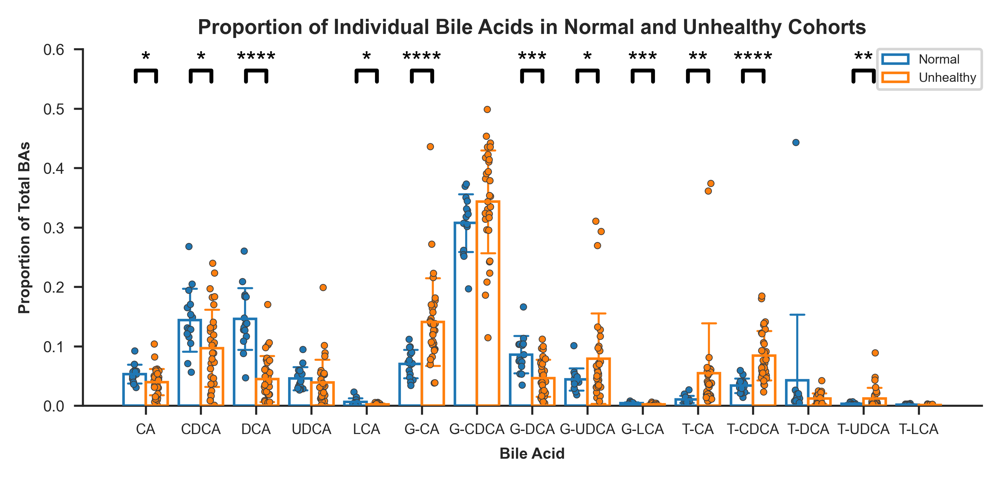

In [219]:
fig, axs = plt.subplot_mosaic([['A']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']

sns.set_style("ticks")


sns.barplot(data=prop_DF, x="BA", y="Proportion", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=prop_DF, x="BA", y="Proportion", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=2.5, legend=False, linewidth=.3)



ax1.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')
ax1.set_title("Proportion of Individual Bile Acids in Normal and Unhealthy Cohorts", fontsize=8, weight='bold')

ax1_annotations = automatic_annotations_prop(prop_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(0,0.6)


for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    # ax.text(
    #     0.0, 1.0, label, transform=(
    #         ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
    #     fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    
plt.savefig("F11.png", bbox_inches='tight')

plt.show()

# Supplementary Fig 2: G-CDCA and T-UDCA concentration by Protein Preciptation Solvent

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3043432049.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(["Methanol", "Acetonitrile", "Trichloroacetic\nAcid"])
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3043432049.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(["Methanol", "Acetonitrile", "Sodium\nHydroxide"])


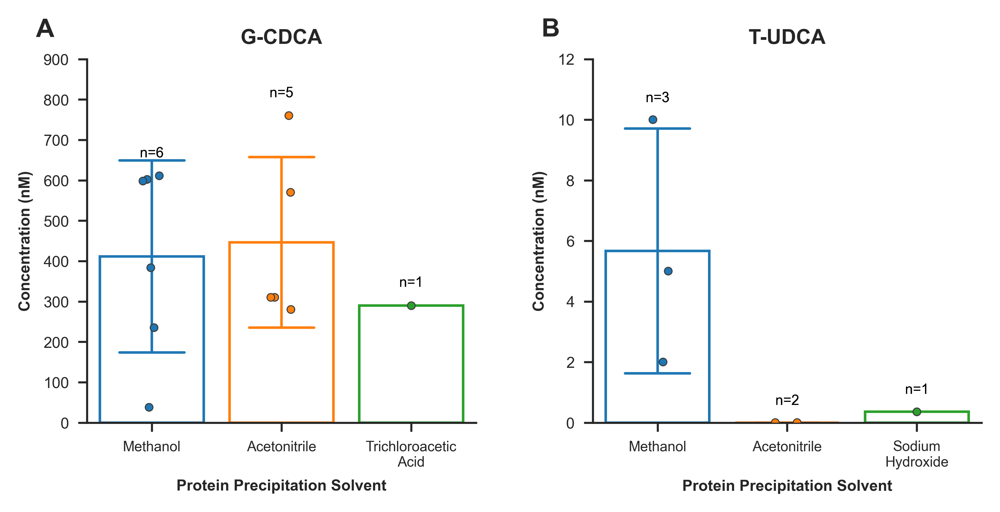

In [220]:
fig, axs = plt.subplot_mosaic([['A', 'B']],figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

#Fig A - G-CDCA
sns.barplot(data=gcdca_plasma_fasted_lcms_nm_data, x="Protein Precipitation", y="G-CDCA", ax=ax1, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order = ["Methanol", "Acetonitrile", "Trichloroacetic Acid"], hue_order= ["Methanol", "Acetonitrile", "Trichloroacetic Acid"])
sns.stripplot(data=gcdca_plasma_fasted_lcms_nm_data, x='Protein Precipitation', y='G-CDCA', hue='Protein Precipitation', ax=ax1, dodge=False, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order = ["Methanol", "Acetonitrile", "Trichloroacetic Acid"])
ax1.set_ylim(0, 900)
ax1.set_xlim(0, None)
ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax1.set_title("G-CDCA", fontsize=8, weight='bold')

ax1.set_xticklabels(["Methanol", "Acetonitrile", "Trichloroacetic\nAcid"])

#Fig A - T-UDCA
sns.barplot(data=tudca_plasma_fasted_lcms_nm_data, x="Protein Precipitation", y="T-UDCA", ax=ax2, hue="Protein Precipitation", errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 1}, legend=False, linewidth=1, order = ["Methanol", "Acetonitrile", "Sodium Hydroxide"], hue_order= ["Methanol", "Acetonitrile", "Sodium Hydroxide"])
sns.stripplot(data=tudca_plasma_fasted_lcms_nm_data, x='Protein Precipitation', y='T-UDCA', hue='Protein Precipitation', ax=ax2, dodge=False, alpha=1, linewidth=0.4, size = 3, legend=False, hue_order = ["Methanol", "Acetonitrile", "Sodium Hydroxide"])
ax2.set_ylim(0, 12)
ax2.set_xlim(0, None)
ax2.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax2.set_xlabel("Protein Precipitation Solvent", fontsize=6, weight='bold')
ax2.set_title("T-UDCA", fontsize=8, weight='bold')
ax2.set_xticklabels(["Methanol", "Acetonitrile", "Sodium\nHydroxide"])



for label, ax in axs.items():

    ax.text(
        0.0, 1, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    
    # Set x-axis limits to fit all x values for both plots
    ax1.set_xlim(-0.5, len(gcdca_plasma_fasted_lcms_nm_data["Protein Precipitation"].unique()) - 0.5)
    ax2.set_xlim(-0.5, len(tudca_plasma_fasted_lcms_nm_data["Protein Precipitation"].unique()) - 0.5)

    # Add number of points for each x value on top of the scatter/bar plots for G-CDCA
    for i, category in enumerate(["Methanol", "Acetonitrile", "Trichloroacetic Acid"]):
        n = gcdca_plasma_fasted_lcms_nm_data[gcdca_plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["G-CDCA"].count()
        y_max = gcdca_plasma_fasted_lcms_nm_data[gcdca_plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["G-CDCA"].max()
        if pd.notnull(y_max):
            ax1.text(i, y_max + 40, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

    # Add number of points for each x value on top of the scatter/bar plots for T-UDCA
    for i, category in enumerate(["Methanol", "Acetonitrile", "Sodium Hydroxide"]):
        n = tudca_plasma_fasted_lcms_nm_data[tudca_plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["T-UDCA"].count()
        y_max = tudca_plasma_fasted_lcms_nm_data[tudca_plasma_fasted_lcms_nm_data["Protein Precipitation"] == category]["T-UDCA"].max()
        if pd.notnull(y_max):
            ax2.text(i, y_max + 0.5, f"n={n}", ha='center', va='bottom', fontsize=5.5, color='black')

plt.subplots_adjust(wspace=0.3, top=0.9, hspace=0.4)

plt.savefig("S2.png", bbox_inches='tight')



# Supplementary Table 2: Brown-Forsythe Filtered vs All Data

In [221]:
#Statistical test for altered variance - Levene (Brown-Forsythe)

bas_list = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

p_values = {}
for ba in bas_list:
    all_values = healthy_DF[healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
    filtered_values = filtered_healthy_DF[filtered_healthy_DF["BA"] == ba]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(all_values, filtered_values, center='median')

    p_values.update({ba: [p_value, np.var(all_values), np.var(filtered_values)]})

In [222]:
p_values

{'CA': [np.float64(0.5009126143390016),
  np.float64(29244.11888423122),
  np.float64(4756.25)],
 'CDCA': [np.float64(0.38253230871382693),
  np.float64(64480.48905749414),
  np.float64(7320.25)],
 'DCA': [np.float64(0.2756793300226381),
  np.float64(27024.56520317307),
  np.float64(3373.25)],
 'UDCA': [np.float64(0.359320321458657),
  np.float64(9957.223269198472),
  np.float64(57.046666666666624)],
 'LCA': [np.float64(0.5726896322367148),
  np.float64(11335.43862500455),
  np.float64(20.222222222222225)],
 'G-CA': [np.float64(0.48707918042793663),
  np.float64(38129.343503460346),
  np.float64(1982.25)],
 'G-CDCA': [np.float64(0.1553969304960413),
  np.float64(204384.88456317812),
  np.float64(25506.25)],
 'G-DCA': [np.float64(0.21078166207114093),
  np.float64(28914.995403308214),
  np.float64(1886.75)],
 'G-UDCA': [np.float64(0.04925209211945024),
  np.float64(2759.7761163273954),
  np.float64(29.555555555555554)],
 'G-LCA': [np.float64(0.30087986430417113),
  np.float64(727.575674

In [223]:
#Statistical test for altered variance - Levene (Brown-Forsythe)

bas_list = ["totalCA", "totalCDCA", "totalDCA", "totalUDCA", "totalLCA"]

p_values = {}
for ba in bas_list:
    all_values = healthy_total_DF[healthy_total_DF["BA"] == ba]["Conc"].dropna().to_list()
    filtered_values = filtered_healthy_total_DF[filtered_healthy_total_DF["BA"] == ba]["Conc"].dropna().to_list()
    
    stat, p_value = stats.levene(all_values, filtered_values, center='median')

    p_values.update({ba: [p_value, np.var(all_values), np.var(filtered_values)]})


In [224]:
p_values

{'totalCA': [np.float64(0.4100188682689385),
  np.float64(114163.47929565971),
  np.float64(14102.301875)],
 'totalCDCA': [np.float64(0.11089791511644506),
  np.float64(614451.6832262839),
  np.float64(68800.9075)],
 'totalDCA': [np.float64(0.10313871612398025),
  np.float64(291106.86503584805),
  np.float64(10868.421875)],
 'totalUDCA': [np.float64(0.6057868216321227),
  np.float64(219043.87712004606),
  np.float64(2.25)],
 'totalLCA': [np.float64(0.37475119348113595),
  np.float64(21464.069568999996),
  np.float64(25.039999999999996)]}

# Supplementary Figure 3

In [225]:
healthy_unhealthy_DF = peripheral_data.loc[(peripheral_data["Healthy/Unhealthy"].isin(["Normal", "Unhealthy"]))]

In [226]:
new_DF = pd.DataFrame(data=healthy_unhealthy_DF[["Healthy/Unhealthy", "Serum/Plasma", "Fasted/Fed", "Analysis Technique", "CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA", "Metabolic/HCC/Cholestatsis", "Starting Volume", "Protein Precipitation"]])

In [227]:
nonan_DF = new_DF.dropna(subset=["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"])

In [228]:
def catergorize_value(value):
    if value in ["Normal", "Metabolic"]:
        return value
    else:
        return "Other"

In [229]:
nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3019460212.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF["Metabolic/HCC/Cholestatsis"] = nonan_DF["Metabolic/HCC/Cholestatsis"].apply(catergorize_value)


In [230]:
nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3139972457.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF.fillna({"Metabolic/HCC/Cholestatsis": "Other"}, inplace=True)


In [231]:
BAs = ["CA", "CDCA", "DCA", "UDCA", "LCA", "G-CA", "G-CDCA", "G-DCA", "G-UDCA", "G-LCA", "T-CA", "T-CDCA", "T-DCA", "T-UDCA", "T-LCA"]

for ba in BAs:
    nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)


C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonan_DF[f"{ba}_proportion"] = nonan_DF[ba]/nonan_DF[BAs].sum(axis=1, min_count=1)
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\1902990194.py:4: SettingWithCopyWarning: 
A value is trying to b

In [232]:
proportion_DF = nonan_DF.drop(BAs, axis=1)

In [233]:
#Data in Longform

x = []
y = []
z = []
a = []
b = []
c = []
d = []
e = []

for ba in BAs:
    x.extend([ba]*len(proportion_DF[f"{ba}_proportion"]))
    y.extend(proportion_DF[f"{ba}_proportion"].to_list())
    z.extend(proportion_DF["Healthy/Unhealthy"].to_list())
    a.extend(proportion_DF["Serum/Plasma"].to_list())
    b.extend(proportion_DF["Fasted/Fed"].to_list())
    c.extend(proportion_DF["Analysis Technique"].to_list())
    d.extend(proportion_DF["Starting Volume"].to_list())
    e.extend(proportion_DF["Protein Precipitation"].to_list())


prop_DF = pd.DataFrame([x,y,z,a,b,c,d,e])
prop_DF = prop_DF.transpose()

prop_DF = prop_DF.rename(columns={0: "BA", 1:"Proportion", 2:"Healthy/Unhealthy",  3:"Serum/Plasma", 4:"Fasted/Fed", 5:"Analysis Technique", 6:"Starting Volume", 7:"Protein Precipitation"})
prop_DF

,BA,Proportion,Healthy/Unhealthy,Serum/Plasma,Fasted/Fed,Analysis Technique,Starting Volume,Protein Precipitation
0,CA,0.000734,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
1,CA,0.036579,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
2,CA,0.054558,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
3,CA,0.061677,Unhealthy,Plasma,Unknown,LC-MS,50.0,Methanol
4,CA,0.058966,Normal,Plasma,Unknown,LC-MS,50.0,Methanol
...,...,...,...,...,...,...,...,...
700,T-LCA,0.0,Normal,Serum,Fasted,LC-MS,50.0,Methanol
701,T-LCA,0.000841,Normal,Serum,Fasted,LC-MS,50.0,Methanol
702,T-LCA,0.001839,Unhealthy,Serum,Fasted,LC-MS,50.0,Methanol
703,T-LCA,0.00227,Unhealthy,Serum,Fasted,LC-MS,50.0,Methanol


In [234]:
normal_prop_DF = prop_DF.loc[prop_DF["Healthy/Unhealthy"] == "Normal"]

In [235]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Serum"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Serum/Plasma"] == "Plasma"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Serum", ba), ("Plasma", ba), p_value))

    return annotations

In [236]:
absolute_DF = nonan_DF[BAs]
absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]
proportion_DF = nonan_DF.drop(BAs, axis=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\2772215554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\2772215554.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]


In [237]:
#Data in Longform

x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(absolute_DF[ba]))
    y.extend(absolute_DF[ba].to_list())
    z.extend(absolute_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

abs_DF = pd.DataFrame([x,y,z,a])
abs_DF = abs_DF.transpose()

abs_DF = abs_DF.rename(columns={0: "BA", 1:"Concentration", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
abs_DF

,BA,Concentration,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,119.0,Unhealthy,Other
1,CA,334.0,Unhealthy,Other
2,CA,398.0,Unhealthy,Other
3,CA,492.0,Unhealthy,Other
4,CA,268.0,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.6,Normal,Normal
702,T-LCA,3.4,Unhealthy,Metabolic
703,T-LCA,3.1,Unhealthy,Metabolic


In [238]:
#Data in Longform

x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(proportion_DF[f"{ba}_proportion"]))
    y.extend(proportion_DF[f"{ba}_proportion"].to_list())
    z.extend(proportion_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

prop_DF = pd.DataFrame([x,y,z,a])
prop_DF = prop_DF.transpose()

prop_DF = prop_DF.rename(columns={0: "BA", 1:"Proportion", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
prop_DF

,BA,Proportion,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,0.000734,Unhealthy,Other
1,CA,0.036579,Unhealthy,Other
2,CA,0.054558,Unhealthy,Other
3,CA,0.061677,Unhealthy,Other
4,CA,0.058966,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.000841,Normal,Normal
702,T-LCA,0.001839,Unhealthy,Metabolic
703,T-LCA,0.00227,Unhealthy,Metabolic


In [239]:
normal_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Other"]


normal_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Other"]

In [240]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

In [241]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

In [242]:
absolute_DF = nonan_DF[BAs]
absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]
proportion_DF = nonan_DF.drop(BAs, axis=1)

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\2772215554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\2772215554.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Normal/Metabolic/Other"] = nonan_DF["Metabolic/HCC/Cholestatsis"]


In [243]:
#Data in Longform

x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(absolute_DF[ba]))
    y.extend(absolute_DF[ba].to_list())
    z.extend(absolute_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

abs_DF = pd.DataFrame([x,y,z,a])
abs_DF = abs_DF.transpose()

abs_DF = abs_DF.rename(columns={0: "BA", 1:"Concentration", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
abs_DF

,BA,Concentration,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,119.0,Unhealthy,Other
1,CA,334.0,Unhealthy,Other
2,CA,398.0,Unhealthy,Other
3,CA,492.0,Unhealthy,Other
4,CA,268.0,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.6,Normal,Normal
702,T-LCA,3.4,Unhealthy,Metabolic
703,T-LCA,3.1,Unhealthy,Metabolic


In [244]:
metabolic_other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"].isin(["Metabolic", "Other"])]

In [245]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Other"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Metabolic", ba), ("Other", ba), p_value))

    return annotations

In [246]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Other"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Metabolic", ba), ("Other", ba), p_value))

    return annotations

In [247]:
normal_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Other"]

normal_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Other"]
metabolic_other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"].isin(["Metabolic", "Other"])]

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\201661530.py:9: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\201661530.py:10: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, which may produce an uninterpretable plot.
  sns.stripplot(data=other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")
C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\201661530.py:21: UserWarning: 
The palette list has fewer values (1) than needed (2) and will cycle, whic

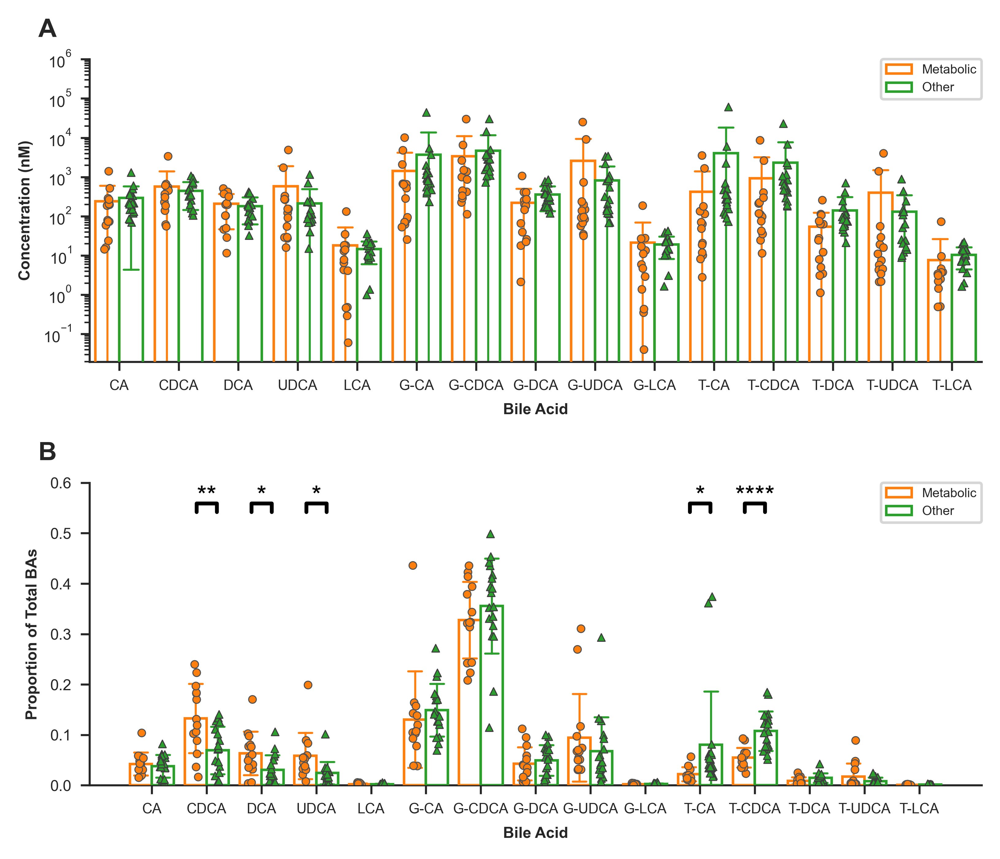

In [248]:
fig, axs = plt.subplot_mosaic([['A'], ['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
sns.set_style("ticks")

sns.barplot(data=metabolic_other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, palette=["C1", "C2"])

sns.stripplot(data=metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
sns.stripplot(data=other_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")



ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1.set_yscale('log')

sns.barplot(data=metabolic_other_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10, palette=["C1", "C2"])

sns.stripplot(data=metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C1"])
sns.stripplot(data=other_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Metabolic", "Other"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4, zorder=10, palette=["C2"], marker="^")


ax2.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')

for label, ax in axs.items():
    ax.legend(loc='upper right', borderaxespad=0., fontsize=5)
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)


#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(metabolic_other_abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None,1e6)

#Ax2
ax2_annotations = automatic_annotations_prop(metabolic_other_prop_DF, type="individual")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(0,0.6)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

plt.savefig("S3.png", bbox_inches='tight')

plt.show()

# Supplementary Figure 4

In [249]:
x = []
y = []
z = []
a = []

for ba in BAs:
    x.extend([ba]*len(proportion_DF[f"{ba}_proportion"]))
    y.extend(proportion_DF[f"{ba}_proportion"].to_list())
    z.extend(proportion_DF["Healthy/Unhealthy"].to_list())
    a.extend(absolute_DF["Normal/Metabolic/Other"].to_list())

prop_DF = pd.DataFrame([x,y,z,a])
prop_DF = prop_DF.transpose()

prop_DF = prop_DF.rename(columns={0: "BA", 1:"Proportion", 2:"Healthy/Unhealthy", 3:"Normal/Metabolic/Other"})
prop_DF
normal_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"] == "Other"]


normal_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Normal"]
metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Metabolic"]
other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"] == "Other"]
metabolic_other_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"].isin(["Metabolic", "Other"])]
metabolic_other_prop_DF

,BA,Proportion,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,0.000734,Unhealthy,Other
1,CA,0.036579,Unhealthy,Other
2,CA,0.054558,Unhealthy,Other
3,CA,0.061677,Unhealthy,Other
5,CA,0.006268,Unhealthy,Other
...,...,...,...,...
697,T-LCA,0.0,Unhealthy,Metabolic
698,T-LCA,0.001498,Unhealthy,Metabolic
699,T-LCA,0.0,Unhealthy,Metabolic
702,T-LCA,0.001839,Unhealthy,Metabolic


In [250]:
prop_DF

,BA,Proportion,Healthy/Unhealthy,Normal/Metabolic/Other
0,CA,0.000734,Unhealthy,Other
1,CA,0.036579,Unhealthy,Other
2,CA,0.054558,Unhealthy,Other
3,CA,0.061677,Unhealthy,Other
4,CA,0.058966,Normal,Normal
...,...,...,...,...
700,T-LCA,0.0,Normal,Normal
701,T-LCA,0.000841,Normal,Normal
702,T-LCA,0.001839,Unhealthy,Metabolic
703,T-LCA,0.00227,Unhealthy,Metabolic


In [251]:
normal_metabolic_abs_DF = abs_DF[abs_DF["Normal/Metabolic/Other"].isin(["Normal", "Metabolic"])]
normal_metabolic_prop_DF = prop_DF[prop_DF["Normal/Metabolic/Other"].isin(["Normal", "Metabolic"])]

In [252]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Normal"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Metabolic", ba), p_value))

    return annotations

In [253]:
def automatic_annotations_prop(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Normal"]["Proportion"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Normal/Metabolic/Other"] == "Metabolic"]["Proportion"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Metabolic", ba), p_value))

    return annotations

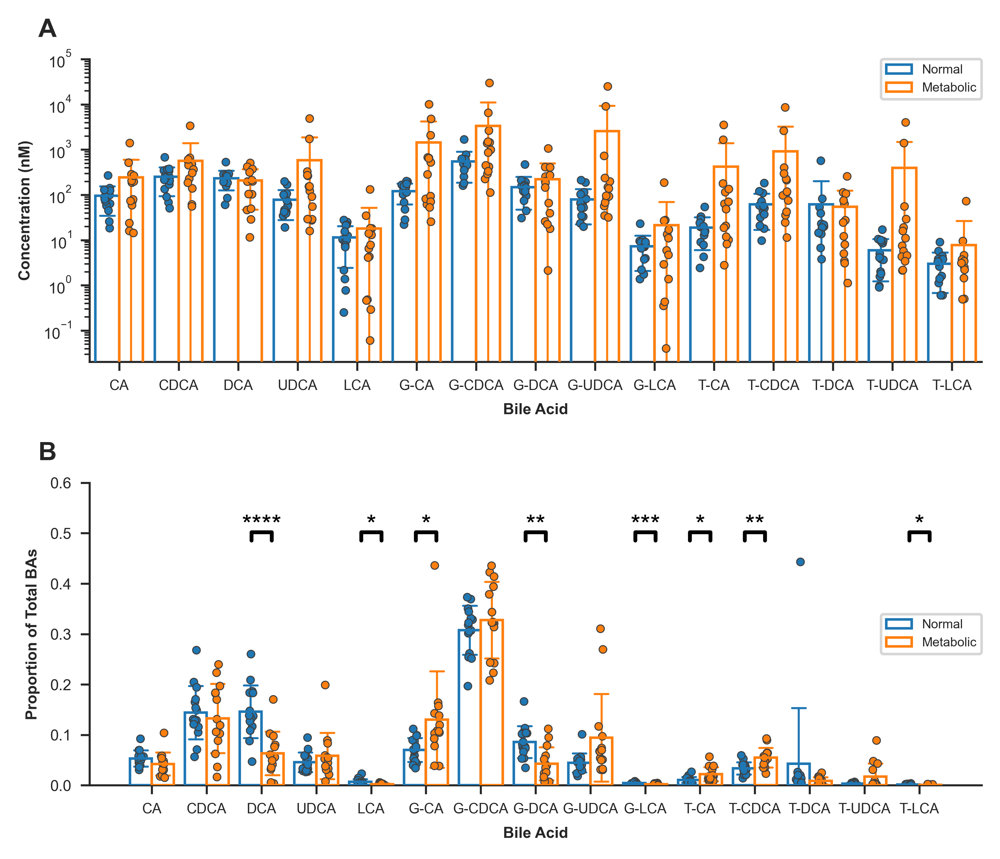

In [254]:
fig, axs = plt.subplot_mosaic([['A'], ['B']], figsize=(6.26, 5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']

sns.set_style("ticks")

sns.barplot(data=normal_metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=normal_metabolic_abs_DF, x="BA", y="Concentration", ax=ax1, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4)

ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1.set_yscale('log')


sns.barplot(data=normal_metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=normal_metabolic_prop_DF, x="BA", y="Proportion", ax=ax2, hue="Normal/Metabolic/Other", hue_order=["Normal", "Metabolic"], dodge=True, alpha=1, size=3, legend=False, linewidth=.4)

ax2.set_ylabel("Proportion of Total BAs", fontsize=6, weight='bold')
ax2.set_xlabel("Bile Acid", fontsize=6, weight='bold')

#Annotations
#Ax1
ax1_annotations = automatic_annotations_conc(normal_metabolic_abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)
ax1.set_ylim(None,1e5)

#Ax2
ax2_annotations = automatic_annotations_prop(normal_metabolic_prop_DF, type="individual")
sb.draw_annotation(ax2_annotations, ax=ax2, fontsize=10, top_margin=0.0001, ns_show=False)
ax2.set_ylim(0,0.6)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.subplots_adjust(wspace=0.5, top=0.9, hspace=0.4)

ax1.legend(loc='upper right', borderaxespad=0., fontsize=5)
ax2.legend(loc='center right', borderaxespad=0., fontsize=5)

plt.savefig("S4.png", bbox_inches='tight')

plt.show()



# Supplementary Figure 6

In [255]:
absolute_DF = nonan_DF[BAs]
absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]

C:\Users\SJ000036\AppData\Local\Temp\ipykernel_4776\3122859591.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  absolute_DF["Healthy/Unhealthy"] = nonan_DF["Healthy/Unhealthy"]


In [256]:
#Data in Longform

x = []
y = []
z = []

for ba in BAs:
    x.extend([ba]*len(absolute_DF[ba]))
    y.extend(absolute_DF[ba].to_list())
    z.extend(absolute_DF["Healthy/Unhealthy"].to_list())

abs_DF = pd.DataFrame([x,y,z])
abs_DF = abs_DF.transpose()

abs_DF = abs_DF.rename(columns={0: "BA", 1:"Concentration", 2:"Healthy/Unhealthy"})
abs_DF

,BA,Concentration,Healthy/Unhealthy
0,CA,119.0,Unhealthy
1,CA,334.0,Unhealthy
2,CA,398.0,Unhealthy
3,CA,492.0,Unhealthy
4,CA,268.0,Normal
...,...,...,...
700,T-LCA,0.0,Normal
701,T-LCA,0.6,Normal
702,T-LCA,3.4,Unhealthy
703,T-LCA,3.1,Unhealthy


In [257]:
def automatic_annotations_conc(DF, type):
    #The type of BA being looked at
    if type == "individual":
        bas_list = np.unique(DF['BA'])
    elif type == "total":
        bas_list = np.unique(DF['BA'])
    
    #Filtering the DF to compare Healthy vs Unhealthy for specific BA
    ##Change columns depending on your need
    p_values = {}
    for ba in bas_list:
        ba_filtered = DF[DF["BA"] == ba]
        healthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Normal"]["Concentration"].dropna().to_list()
        unhealthy_values = ba_filtered[ba_filtered["Healthy/Unhealthy"] == "Unhealthy"]["Concentration"].dropna().to_list()

        # Perform Welch's t-test
        t_statistic, p_value = stats.ttest_ind(healthy_values, unhealthy_values, equal_var=False)

        p_values.update({ba: p_value})
    
    #Creating the starbars annotation in the correct format
    annotations = []
    for ba, p_value in p_values.items():
        annotations.append((("Normal", ba), ("Unhealthy", ba), p_value))

    return annotations

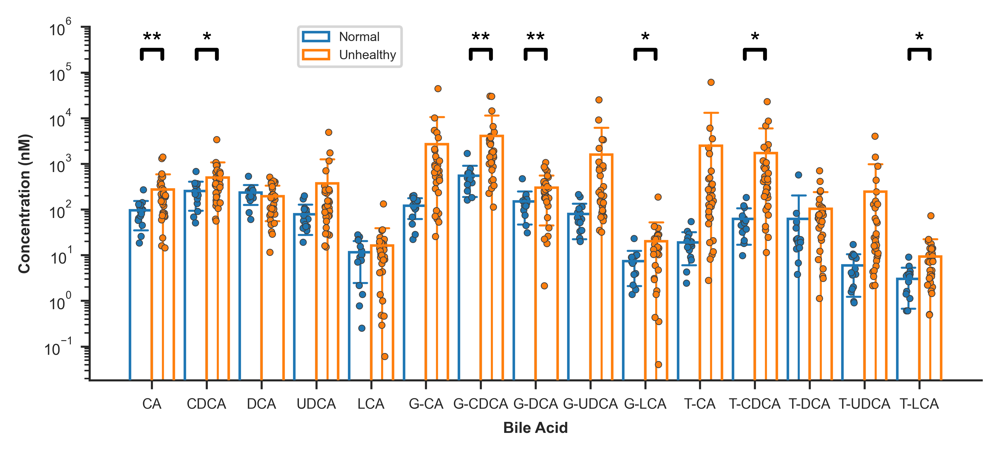

In [258]:
fig, axs = plt.subplot_mosaic([['A']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']

sns.set_style("ticks")


sns.barplot(data=abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], errorbar="sd", capsize=0.5, fill=False, err_kws= {'linewidth': 0.8}, linewidth=1, zorder=10)
sns.stripplot(data=abs_DF, x="BA", y="Concentration", ax=ax1, hue="Healthy/Unhealthy", hue_order=["Normal", "Unhealthy"], dodge=True, alpha=1, size=2.5, legend=False, linewidth=.3)
ax1.set_yscale('log')


ax1.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
ax1.set_xlabel("Bile Acid", fontsize=6, weight='bold')

ax1_annotations = automatic_annotations_conc(abs_DF, type="individual")
sb.draw_annotation(ax1_annotations, ax=ax1, fontsize=10, top_margin=0.0001, ns_show=False)

ax1.set_ylim(None, 1e6)

for label, ax in axs.items():
    ax.legend(bbox_to_anchor=(0.35,1), borderaxespad=0., fontsize=5)
    # ax.text(
    #     0.0, 1.0, label, transform=(
    #         ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
    #     fontsize='10', va='bottom', weight='bold')
    ax.xaxis.set_tick_params(labelsize=5.5)
    ax.yaxis.set_tick_params(labelsize=6)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    
plt.savefig("S6.png", bbox_inches='tight')

plt.show()

# Supplementary Figure 7

In [259]:
healthy_peripheral_data = peripheral_data[peripheral_data["Healthy/Unhealthy"].isin(["Normal"])]

In [260]:
gcdca_healthy_DF = healthy_DF[healthy_DF["BA"].isin(["G-CDCA"])]
tudca_healthy_DF = healthy_DF[healthy_DF["BA"].isin(["T-UDCA"])]

In [261]:
def hue_regplot(data, x, y, hue, palette=None, **kwargs):
    from matplotlib import colormaps
    
    regplots = []
    
    levels = sorted(data[hue].unique()) #sorted added to get alphabetical order i.e. ['Healthy', 'Unhealthy']
    
    if palette is None:
        #default_colors = get_cmap('tab10') 
        default_colors = colormaps['tab10']
        palette = {k: default_colors(i) for i, k in enumerate(levels)}
    
    for key in levels:
        regplots.append(
            sns.regplot(
                x=x,
                y=y,
                data=data[data[hue] == key],
                color=palette[key],
                **kwargs
            )
        )
    
    return regplots

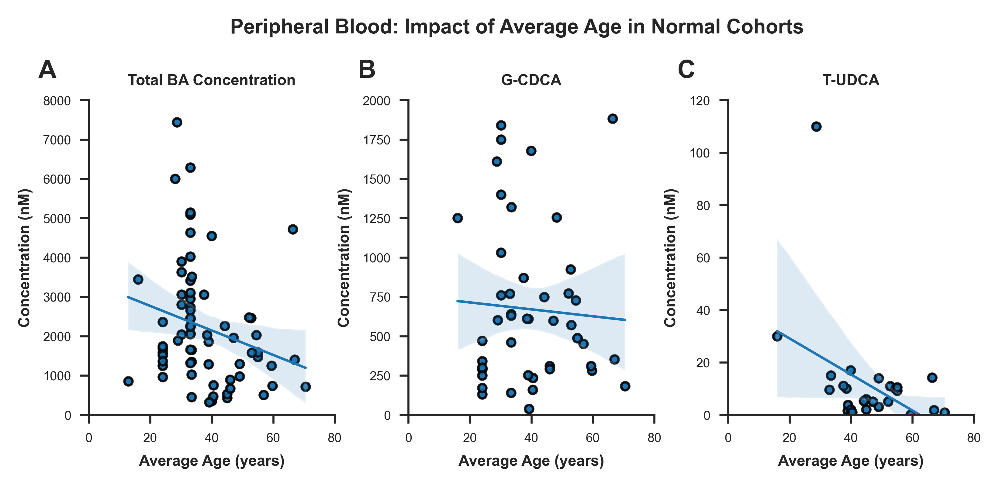

In [262]:
fig, axs = plt.subplot_mosaic([['A', 'B', 'C']], figsize=(6.26, 2.5), dpi=600)

ax1 = axs['A']
ax2 = axs['B']
ax3 = axs['C']

#Fig A
sns.scatterplot(data=healthy_peripheral_data, x="Average Age", y="Total BAs", ax=ax1, s=10, edgecolor='black', linewidth=0.5, legend=False)
# for hue_value in lcms_healthy_unhealthy_peripheral_data['Healthy/Unhealthy'].unique():
#     filtered_df = lcms_healthy_unhealthy_peripheral_data[lcms_healthy_unhealthy_peripheral_data['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Total BAs", data=filtered_df, ax=ax2, ci=95)
hue_regplot(data=healthy_peripheral_data, x="Average Age", y="Total BAs", ax=ax1, scatter_kws={'s': 10, 'edgecolor': 'black'}, hue='Healthy/Unhealthy', line_kws={'linewidth': 1})
ax1.set_ylim(0, 8000)
ax1.set_xlim(0, 80)
ax1.set_title("Total BA Concentration", fontsize=6, weight='bold')

#Fig B
sns.scatterplot(data=gcdca_healthy_DF, x="Average Age", y="Conc", ax=ax2, s=10, edgecolor='black', linewidth=0.5, legend=False)
# for hue_value in gcdca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'].unique():
#     filtered_df = gcdca_lcms_healthy_unhealthy_DF[gcdca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Conc", data=filtered_df, ax=ax3, ci=95)
hue_regplot(data=gcdca_healthy_DF, x="Average Age", y="Conc", hue='Healthy/Unhealthy', ax=ax2, scatter_kws={'s': 10, 'edgecolor': 'black'}, line_kws={'linewidth': 1})


ax2.set_ylim(0, 2000)
ax2.set_xlim(0, 80)
ax2.set_title("G-CDCA", fontsize=6, weight='bold')


#Fig C
sns.scatterplot(data=tudca_healthy_DF, x="Average Age", y="Conc", ax=ax3, s=10, edgecolor='black', linewidth=0.5)
# for hue_value in tlca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'].unique():
#     filtered_df = tlca_lcms_healthy_unhealthy_DF[tlca_lcms_healthy_unhealthy_DF['Healthy/Unhealthy'] == hue_value]
#     sns.regplot(x="Starting Volume", y="Conc", data=filtered_df, ax=ax4, ci=95)
hue_regplot(data=tudca_healthy_DF, x="Average Age", y="Conc", hue='Healthy/Unhealthy', ax=ax3, scatter_kws={'s': 10, 'edgecolor': 'black'}, line_kws={'linewidth': 1})

ax3.set_ylim(0, 120)
ax3.set_xlim(0, 80)
ax3.set_title("T-UDCA", fontsize=6, weight='bold')

axes = [ax1, ax2, ax3]

for i in axes:
    i.set_ylabel("Concentration (nM)", fontsize=6, weight='bold')
    i.set_xlabel("Average Age (years)", fontsize=6, weight='bold')
    #i.set_title("", fontsize=10, weight='bold')
    i.xaxis.set_tick_params(labelsize=5)
    i.yaxis.set_tick_params(labelsize=5)
    i.spines['top'].set_visible(False)
    i.spines['right'].set_visible(False)

fig.suptitle("Peripheral Blood: Impact of Average Age in Normal Cohorts", fontsize=8, weight='bold')

plt.subplots_adjust(wspace=0.3, top=0.8, hspace=2)

for label, ax in axs.items():
    ax.text(
        0.0, 1.0, label, transform=(
            ax.transAxes + ScaledTranslation(-20/72, +7/72, fig.dpi_scale_trans)),
        fontsize='10', va='bottom', weight='bold')
    

plt.savefig("S7.png", bbox_inches='tight')

plt.show()
